<a href="https://colab.research.google.com/github/dolmani38/concept_drift/blob/main/230624_DD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Concept drift tolerant machine learning method

In [1]:
import numpy as np
import pandas as pd
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [3]:
import random
import os
def seed_everything(seed: int = 46):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    #tf.random.set_seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

# 실험을 위한 기본적인 function 들...

In [4]:
import sys, os
import math

from torch.autograd import Variable
from argparse import Namespace
#from FRTrain_arch import Generator, DiscriminatorF, DiscriminatorR, weights_init_normal, test_model
#from FRTrain_arch import weights_init_normal, test_model
import warnings
warnings.filterwarnings("ignore")

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

In [5]:
main_figsize=(15,3)

In [6]:
#  I(Z,B) > 0의 관계에 대해 z0를 전처리
class Sensitivity_Adapter(nn.Module):

    def __init__(self,input_dim):
        """Initializes DiscriminatorF with torch components."""

        super(Sensitivity_Adapter, self).__init__()

        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        #self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(2, self.input_dim*10))
            #self.fc2.append(nn.BatchNorm1d(num_features=50))
            self.fc3.append(nn.Linear(self.input_dim*10, 1))

        #self.fc = nn.Linear(input_dim, input_dim)

    def forward(self,x,b):
        pxy = []
        for i in range(self.input_dim):
            h0 = self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1))
            #h1 = F.relu(self.fc2[i](h0))
            #h2 = self.fc3[i](h1)
            h2 = self.fc3[i](F.relu(h0))
            pxy.append(h2)

        #return self.fc(torch.tensor(torch.cat(pxy, dim=1), requires_grad = True))
        return torch.cat(pxy, dim=1)


In [7]:
# Define the Generator
class Generator(nn.Module):
    """FR-Train generator (classifier).

    This class is for defining the structure of FR-Train generator (classifier).
    (ref: FR-Train paper, Section 3)

    Attributes:
        model: A model consisting of torch components.
    """

    def __init__(self):
        """Initializes Generator with torch components."""
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(5, 20),
            nn.ReLU(),
            nn.Linear(20, 5),
            nn.ReLU(),
            nn.Linear(5, 1),
            nn.Sigmoid()
        )

    def forward(self, input_data):
        """Defines a forward operation of the model.

        Args:
            input_data: The input data.

        Returns:
            The predicted label (y_hat) for the given input data.
        """

        output = self.model(input_data)
        return output


In [8]:
from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score

def test_model(model_,model2_, tX, ty, s1):
    model_.eval()

    if model2_ == None:
        ax = tX[:,0:5]
    else:
        model2_.eval()
        ax = model2_(tX[:,0:5],tX[:,5].reshape(-1,1)/avaible_range)

    y_hat = model_(ax)
    y_hat = (y_hat.cpu().data.numpy()> 0.5).astype(float)

    print('ty',ty.shape)
    print('y_hat',y_hat.shape)
    ty_ = ty.cpu().data.numpy()
    f1 = f1_score(ty_,y_hat)
    #print('R-squared score',r2)
    mi_scores = make_mi_scores(pd.DataFrame(ax.cpu().data.numpy(),columns=columns), ty_, discrete_features="auto")
    mi = np.sum(mi_scores)
    print("Test f1 score: {}".format(f1))
    print("Sum of MI = {:.3f}".format(mi))
#     min_eo = min(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     max_eo = max(Pr_y_hat_1_y_1_z_0, Pr_y_hat_1_y_1_z_1)
#     print("Equal Opportunity ratio = {:.3f}".format(min_eo/max_eo))
    return f1, mi

In [9]:

def test_all_data(generator,adapter,train_x, XT,yT, ShowChart = False,bucket_size_array=[200]):

    #XT = X[train_size:][['x0','x1','x2','x3','z0','b']]
    #yT = y[train_size:]

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('XT.shape',XT.shape)

    for bucket_size in bucket_size_array:
        bucket_count = int(XT.shape[0]/bucket_size)-1
        f1s = []
        MISS = {}
        DRF = {}
        for col in columns:
            MISS[col] = []
            DRF[col] = []

        for bk in tqdm(range(bucket_count)):
            tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32).to(device)
            tmp_y = yT[bk*bucket_size:bk*bucket_size+bucket_size]
            if adapter == None:
                xs = tmp_x[:,0:5]
            else:
                xs = adapter(tmp_x[:,0:5],tmp_x[:,5].reshape(-1,1)/avaible_range)
            predicted_y = generator(xs)
            predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
            f1 = f1_score(tmp_y,predicted_y)
            #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
            f1s.append(f1)

            cpu_xs = xs.cpu().data.numpy()
            mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), tmp_y, discrete_features="auto")
            ks = __ks_drift(train_x.values,cpu_xs)
            for ix,col in enumerate(columns):
                MISS[col].append(mi_scores[col])
                DRF[col].append(ks[:,0][ix])

        df_mis = pd.DataFrame(MISS)
        df_drf = pd.DataFrame(DRF)

        if ShowChart:
            plt.figure(figsize=main_figsize)
            plt.plot(f1s,linewidth=1)
            plt.ylabel('F1 Score')
            plt.xlabel(f'bucket ({bucket_size})')
            plt.show()

            df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
            plt.legend(loc=1,ncol=5)
            plt.show()

            df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({bucket_size})',fontsize=15)
            plt.legend(loc=1,ncol=5)
            plt.show()

        print(f'mean of drift:\n{df_drf.mean()}')

    print('Mean F1 for all data:',np.mean(f1s))
    return f1s, df_mis, df_drf

In [30]:
loss = nn.MSELoss(reduce=False)
input = torch.randn(3, 5, requires_grad=True)
target = torch.randn(3, 5)
output = torch.mean(loss(input, target),dim=0)
output

tensor([0.5745, 0.6456, 1.4904, 1.4955, 3.5847], grad_fn=<MeanBackward1>)

In [32]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model(train_tensors, test_tensors, train_opt, lambda_f, seed, alpha, ShowChart = False):
    seed_everything()

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)

    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train.to(device)
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test.to(device)
    #s1_test = test_tensors.s1_test.to(device)

    # Saves return values here
    #test_result = []

    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch


    # The loss values of each component will be saved in the following lists.
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    a_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss(reduce=False)  # mean square error

    # Initializes generator and discriminator
    generator = Generator().to(device)

    optimizer_G = torch.optim.Adam(generator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]

    adapter = Sensitivity_Adapter(5).to(device)
    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    #mine = Net()
    #optimizer_M = torch.optim.Adam(mine.parameters(), lr=0.001)

    minibatch = 1000

    for epoch in range(n_epochs):


        # -------------------------------
        #  b에 대한 x의 전처리
        # -------------------------------

        if lambda_f >= 0.0:
            xs = adapter(XS_train[:,0:5],XS_train[:,5].reshape(-1,1)/avaible_range) # z0, b
            ml = torch.mean(mse_loss(xs, XS_train[:,0:5]),dim=0)
            a_loss =  torch.sum(ml) + torch.std(ml)
        else:
            xs = XS_train[:,0:5]
            a_loss = torch.tensor(0)

        a_losses.append(a_loss.cpu().data.numpy())
        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = generator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1))
        g_losses.append(g_loss.cpu().data.numpy())

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()

        if lambda_f >= 0.0:
            loss = (1-lambda_f) * g_loss +  lambda_f * a_loss * alpha #* 0.05
        else:
            loss = g_loss

        loss.backward()
        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()

        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [a loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, a_losses[-1], g_losses[-1])
                )

        if lambda_f < 0.0:
            adapter = None

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1,mi = test_model(generator,adapter, XS_test, y_test, None)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    df_loss = pd.DataFrame({'Adapter loss':a_losses,'Classifier loss':g_losses})
    if ShowChart:
        df_loss.plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel=f'bucket ({bucket_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()
    '''
    plt.figure(figsize=main_figsize)
    plt.plot(a_losses,linewidth=1,label='Adapter loss')
    plt.plot(g_losses,linewidth=1,label='classifier loss')
    plt.ylabel('loss')
    plt.xlabel(f'bucket ({bucket_size})')
    plt.legend(loc=1,ncol=2)
    plt.show()
    '''
    return f1,mi,generator,adapter,df_loss

In [12]:
plt.style.use('bmh')

def __ks_2samp2(sample1, sample2):
    # Gets all observations
    sample1 = np.sort(sample1)
    sample2 = np.sort(sample2)
    n1 = sample1.shape[0]
    n2 = sample2.shape[0]
    data_all = np.concatenate([sample1, sample2])
    cdf1 = np.searchsorted(sample1, data_all, side='right') / n1
    cdf2 = np.searchsorted(sample2, data_all, side='right') / n2
    # Evaluates the KS statistic
    cddiffs = cdf1 - cdf2
    minS = -np.min(cddiffs)
    maxS = np.max(cddiffs)
    ks_stat =  max(minS, maxS)

    #if ks_stat == minS:
    #    ks_stat = -ks_stat

    # Calculates the P-Value based on the two-sided test
    # The P-Value comes from the KS Distribution Survival Function (SF = 1-CDF)
    m, n = float(n1), float(n2)
    en = m * n / (m + n)
    p_value = 0.0 #stats.kstwobign.sf(math.sqrt(en) * abs(ks_stat))
    #p_value = stats.kstwobign.sf(en * abs(ks_stat))
    return ks_stat,p_value

def __ks_drift(ref_x,inf_x):
    x_drift = np.zeros((ref_x.shape[1],2))
    for i in range(ref_x.shape[1]):
        #s, p = ks_2samp(ref_x[:,i],inf_x[:,i],mode='asymp')
        s, p = __ks_2samp2(ref_x[:,i],inf_x[:,i])
        x_drift[i,0] = s
        x_drift[i,1] = p
    return x_drift

In [13]:
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_classif(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

# 실험
+ synthetic data를 만든다.
+ 해당 data는 data drift가 시간에 따라 변화 된다.
+ 이때, 성능의 감소를 정량적으로 측정하고
+ Bucket을 고려한 몇개의 모델을 적용한다.

## synthetic data의 생성 (Case #1 MI의 감소, Drift의 증가 )



+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift

In [14]:
data_size = 40000
cor = [1.5, 1.2, 0.9 , 0.7, 0.5]

In [15]:
seed_everything()

y= (np.random.normal(0.5,0.5,100) > 0.5).astype(int)
sum(y)

40

In [16]:
seed_everything()
#y= np.random.normal(1,2,data_size)
y= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x[:,ix] = y + np.random.normal(1,cor_,data_size)
    #sns.scatterplot(x=x[:,ix],y=y)

In [17]:
seed_everything(100)

for i in range(400):
    s = i*100
    #x[s:s+100,3] = y[s:s+100] + np.random.normal(1,5-(i/100),100)
    x[s:s+100,4] = y[s:s+100] + np.random.normal(1,0.5+(i/100),100)
    #x[s:s+100,5] = i
#sns.scatterplot(x=x[0:200,4],y=y[0:200])
#sns.scatterplot(x=x[39800:40000,4],y=y[39800:40000])

### KS-test 통계량의 측정

In [18]:
columns=['x0','x1','x2','x3','z0']
X = pd.DataFrame(x,columns=columns)
mi_scores = make_mi_scores(X, y, discrete_features="auto")
print(mi_scores)

x3    0.202783
x2    0.134082
x1    0.079411
x0    0.050887
z0    0.027068
Name: MI Scores, dtype: float64


Bucket size 200 step_size 190


100%|██████████| 190/190 [00:02<00:00, 71.99it/s]


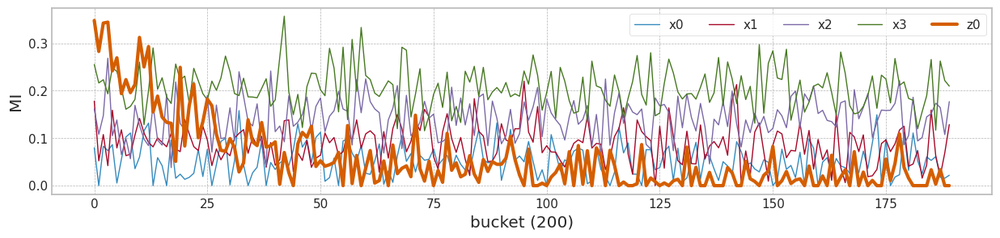

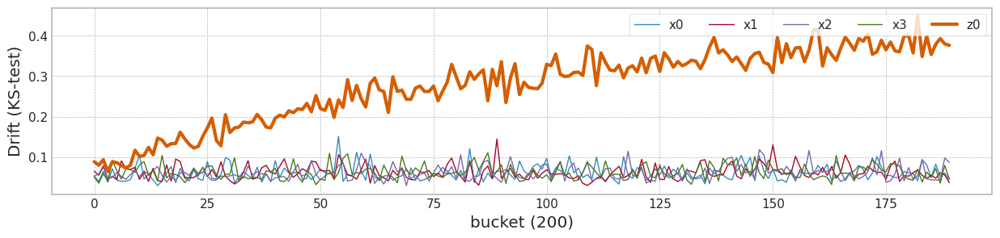

In [19]:
from tqdm import tqdm

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

bucket_size_array=[200]#[10,50,100,200]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler_c1 = MinMaxScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:1800]), scaler_c1.transform(X[1800:])),axis=0), columns=columns)


for bucket_size in bucket_size_array:
    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((x.shape[0]-2000)/bucket_size)

    print('Bucket size',bucket_size,'step_size',step_size)

    for bk in tqdm(range(step_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X[bk*bucket_size:bk*bucket_size+bucket_size], y[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X[0:1800].values,X[bk*bucket_size+2000:bk*bucket_size+bucket_size+2000].values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)
    '''
    df_mis['x0'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x1'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x2'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x3'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['z0'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    '''
    plt.figure(figsize=main_figsize)
    plt.plot(df_mis[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_mis['z0'].values,linewidth=3,label='z0')
    plt.ylabel('MI')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

    plt.figure(figsize=main_figsize)
    plt.plot(df_drf[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_drf['z0'].values,linewidth=3,label='z0')
    plt.ylabel('Drift (KS-test)')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

### 학습 및 전체 예측

+ 2000개를 학습하고, 이후 38000개를 추정한다.

cuda:0


100%|██████████| 1000/1000 [00:26<00:00, 37.69it/s]


MSE: 0.25
RMSE: 0.50


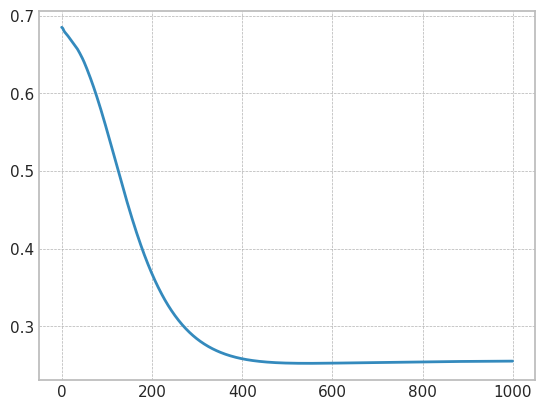

feature 5, test_f1 0.8636363636363636


In [20]:
import copy
import torch.optim as optim

seed_everything()

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
# Convert to 2D PyTorch tensors
X_train = torch.tensor(X[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32).to(device)
y_train = torch.tensor(y[0:1800], dtype=torch.float32).reshape(-1, 1).to(device)

X_test = torch.tensor(X[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32).to(device)
y_test = torch.tensor(y[1800:2000], dtype=torch.float32).reshape(-1, 1).to(device)

# Define the model
model = nn.Sequential(
    nn.Linear(5, 20),
    nn.ReLU(),
    nn.Linear(20, 5),
    nn.ReLU(),
    nn.Linear(5, 1),
    nn.Sigmoid()
).to(device)

# loss function and optimizer
loss_fn = nn.BCELoss()  # mean square error
optimizer = optim.Adam(model.parameters(), lr=0.0001)

n_epochs = 1000   # number of epochs to run
batch_size = 100  # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)

# Hold the best model
best_mse = np.inf   # init to infinity
best_weights = None
history = []

for epoch in tqdm(range(n_epochs)):
    model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    model.eval()
    y_pred = model(X_test)
    mse = loss_fn(y_pred, y_test)
    mse = float(mse)
    history.append(mse)
    if mse < best_mse:
        best_mse = mse
        best_weights = copy.deepcopy(model.state_dict())

# restore model and return best accuracy
model.load_state_dict(best_weights)
print("MSE: %.2f" % best_mse)
print("RMSE: %.2f" % np.sqrt(best_mse))
plt.plot(history)
plt.show()

from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
predicted_y = model(X_test)
f1 = f1_score(y_test.cpu().data.numpy(),(predicted_y.cpu().data.numpy()> 0.5).astype(float))
print('feature 5, test_f1',f1)

100%|██████████| 189/189 [00:00<00:00, 560.71it/s]


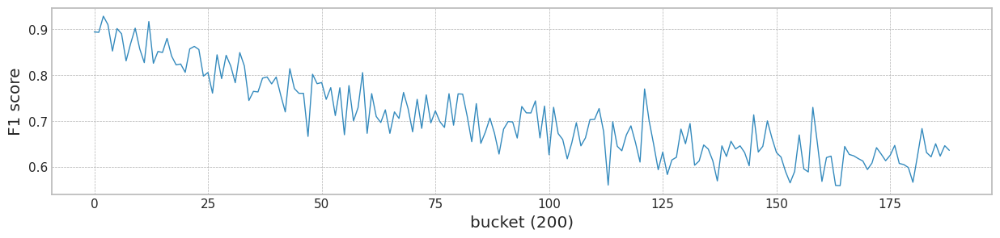

,lambda,test_f1,init_f1,mean_f1,last_f1,SUM(MI)
0,Case #1 Feature 5,0.863636,0.894009,0.70725,0.636364,0.537224


In [21]:

XT = X[2000:][['x0','x1','x2','x3','z0']]
yT = y[2000:]

bucket_size_array=[200]

for bucket_size in bucket_size_array:
    bucket_count = int(XT.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32).to(device)
        predicted_y = model(tmp_x)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)
    plt.figure(figsize=main_figsize)
    plt.plot(f1s,linewidth=1)
    plt.ylabel('F1 score')
    plt.xlabel(f'bucket ({bucket_size})')
    #plt.title('Changes of F1 score according to bucket')
    plt.show()

result_table3 = {}
result_table3['lambda']=[]
result_table3['test_f1']=[]
result_table3['init_f1']=[]
result_table3['mean_f1']=[]
result_table3['last_f1']=[]
result_table3['SUM(MI)']=[]

result_table3['lambda'].append('Case #1 Feature 5')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['SUM(MI)'].append(np.sum(mi_scores))

pd.DataFrame(result_table3)

### 내성 학습의 적용

In [22]:

# bucket 하나의 크기는 100
# 2000개의 학습데이터에는 20개의 bucket이 있음.
# 학습데이터 100개당 +1의 bucket count를 증가 시킴
X['b'] = [int(b) for b in X.index.values/100]
X

,x0,x1,x2,x3,z0,b
0,0.511187,0.348595,0.564807,0.482506,0.395084,0
1,0.435937,0.524656,0.595436,0.762536,0.606272,0
2,0.479071,0.682932,0.738867,0.596141,0.688060,0
3,0.572894,0.251745,0.392850,0.522275,0.344350,0
4,0.562890,0.613393,0.481594,0.596584,0.670729,0
...,...,...,...,...,...,...
39995,0.332800,0.214564,0.468946,0.614324,-0.069684,399
39996,0.414601,0.252607,0.438192,0.601093,0.984518,399
39997,0.361400,0.558191,0.590386,0.612855,0.528420,399
39998,0.459619,0.212723,0.148134,0.664097,2.043499,399


lambda_f2 1.0
cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 0.696380]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.681345]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.668415]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.654487]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.638451]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.618187]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.594688]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.568330]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.539704]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.509774]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.479563]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.450001]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.421808

100%|██████████| 189/189 [00:02<00:00, 63.02it/s]


mean of drift:
x0    0.061049
x1    0.062651
x2    0.061975
x3    0.063260
z0    0.276490
dtype: float64
Mean F1 for all data: 0.7043884044703137
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 2.980269] [G loss: 0.695597]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 15.225924] [G loss: 0.635592]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 172.934570] [G loss: 0.426569]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 649.110962] [G loss: 0.269865]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 1087.221436] [G loss: 0.231923]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 1364.683594] [G loss: 0.226037]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 1526.568481] [G loss: 0.225071]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 1642.125244] [G loss: 0.224795]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 1719.853271] [G loss: 0.224625]
[Lambda: 0.000000] [Epoch 1800/4000] [a loss: 1778.664185] [G loss: 0.224464]
[Lambda: 0.000000] [Epoch 2000/4000] [a loss: 1824.603394] [G loss: 0.224354]
[La

100%|██████████| 189/189 [00:03<00:00, 62.14it/s]


mean of drift:
x0    1.000000
x1    0.999971
x2    1.000000
x3    0.999941
z0    0.997252
dtype: float64
Mean F1 for all data: 0.7509869523519865
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 2.980269] [G loss: 0.695597]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 0.026132] [G loss: 0.687697]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.035999] [G loss: 0.666046]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.108546] [G loss: 0.625429]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.191030] [G loss: 0.571858]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.261849] [G loss: 0.514765]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.335600] [G loss: 0.453549]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.391571] [G loss: 0.395813]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.403111] [G loss: 0.352362]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.388912] [G loss: 0.321117]
[Lambda: 0.100000] [Epoch 2000/4000] [a loss: 0.364561] [G loss: 0.298106]
[Lambda: 0.100000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 62.87it/s]


mean of drift:
x0    0.538345
x1    0.884962
x2    0.861864
x3    0.608078
z0    0.430938
dtype: float64
Mean F1 for all data: 0.6892514542675651
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 2.980269] [G loss: 0.695597]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 0.022898] [G loss: 0.688733]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.010357] [G loss: 0.672127]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.026775] [G loss: 0.644373]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.053122] [G loss: 0.599947]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.085542] [G loss: 0.547883]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.116748] [G loss: 0.492552]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.141149] [G loss: 0.438164]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.151794] [G loss: 0.391957]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.156169] [G loss: 0.354796]
[Lambda: 0.200000] [Epoch 2000/4000] [a loss: 0.151320] [G loss: 0.326516]
[Lambda: 0.200000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 60.71it/s]


mean of drift:
x0    0.952454
x1    0.340961
x2    0.710747
x3    0.297152
z0    0.356778
dtype: float64
Mean F1 for all data: 0.6970481124068753
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 2.980269] [G loss: 0.695597]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 0.022084] [G loss: 0.689247]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.006004] [G loss: 0.674281]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.008703] [G loss: 0.654295]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.020158] [G loss: 0.615881]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.036003] [G loss: 0.569252]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.054317] [G loss: 0.517384]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.069195] [G loss: 0.466022]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.078526] [G loss: 0.418428]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.081327] [G loss: 0.378928]
[Lambda: 0.300000] [Epoch 2000/4000] [a loss: 0.080455] [G loss: 0.347977]
[Lambda: 0.300000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 60.72it/s]


mean of drift:
x0    0.164630
x1    0.376887
x2    0.122158
x3    0.216734
z0    0.355388
dtype: float64
Mean F1 for all data: 0.7565185394734739
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 2.980269] [G loss: 0.695597]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 0.021899] [G loss: 0.689532]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.004699] [G loss: 0.675411]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.003260] [G loss: 0.659065]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.007012] [G loss: 0.636052]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.013853] [G loss: 0.604742]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.022590] [G loss: 0.565783]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.032600] [G loss: 0.521055]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.041347] [G loss: 0.475308]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.047681] [G loss: 0.430062]
[Lambda: 0.400000] [Epoch 2000/4000] [a loss: 0.050510] [G loss: 0.391871]
[Lambda: 0.400000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 61.97it/s]


mean of drift:
x0    0.118163
x1    0.213031
x2    0.267005
x3    0.179195
z0    0.229239
dtype: float64
Mean F1 for all data: 0.8055129223004087
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 2.980269] [G loss: 0.695597]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 0.021877] [G loss: 0.689704]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.004201] [G loss: 0.676136]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.001629] [G loss: 0.660993]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.003177] [G loss: 0.640333]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.006448] [G loss: 0.612764]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.010816] [G loss: 0.578246]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.015968] [G loss: 0.538068]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.021453] [G loss: 0.494928]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.025450] [G loss: 0.453463]
[Lambda: 0.500000] [Epoch 2000/4000] [a loss: 0.027955] [G loss: 0.415757]
[Lambda: 0.500000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 59.94it/s]


mean of drift:
x0    0.290841
x1    0.321229
x2    0.242266
x3    0.148330
z0    0.421631
dtype: float64
Mean F1 for all data: 0.7990982646987174
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 2.980269] [G loss: 0.695597]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 0.021900] [G loss: 0.689880]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.004009] [G loss: 0.676643]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.000932] [G loss: 0.662331]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.001486] [G loss: 0.643221]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.002881] [G loss: 0.618538]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.005032] [G loss: 0.587445]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.007692] [G loss: 0.550967]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.010486] [G loss: 0.511323]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.013135] [G loss: 0.471188]
[Lambda: 0.600000] [Epoch 2000/4000] [a loss: 0.014987] [G loss: 0.433698]
[Lambda: 0.600000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 62.05it/s]


mean of drift:
x0    0.141199
x1    0.308765
x2    0.231170
x3    0.133836
z0    0.284127
dtype: float64
Mean F1 for all data: 0.7961731348007115
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 2.980269] [G loss: 0.695597]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 0.021936] [G loss: 0.689967]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.003945] [G loss: 0.677000]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.000612] [G loss: 0.663218]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.000698] [G loss: 0.645237]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.001243] [G loss: 0.622540]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.002132] [G loss: 0.594444]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.003352] [G loss: 0.561258]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.004728] [G loss: 0.524701]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.006054] [G loss: 0.487007]
[Lambda: 0.700000] [Epoch 2000/4000] [a loss: 0.007146] [G loss: 0.450523]
[Lambda: 0.700000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 61.52it/s]


mean of drift:
x0    0.152584
x1    0.260597
x2    0.217237
x3    0.103980
z0    0.162002
dtype: float64
Mean F1 for all data: 0.8020742063125248
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 2.980269] [G loss: 0.695597]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 0.021973] [G loss: 0.690046]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.003940] [G loss: 0.677270]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.000466] [G loss: 0.663966]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.000338] [G loss: 0.646777]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.000481] [G loss: 0.625574]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.000769] [G loss: 0.599723]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.001186] [G loss: 0.569565]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.001705] [G loss: 0.536146]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.002244] [G loss: 0.501044]
[Lambda: 0.800000] [Epoch 2000/4000] [a loss: 0.002736] [G loss: 0.466209]
[Lambda: 0.800000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 59.79it/s]


mean of drift:
x0    0.151311
x1    0.205259
x2    0.166787
x3    0.079156
z0    0.178166
dtype: float64
Mean F1 for all data: 0.7884702392304985
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 2.980269] [G loss: 0.695597]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 0.022008] [G loss: 0.690084]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.003960] [G loss: 0.677480]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.000411] [G loss: 0.664604]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000197] [G loss: 0.645422]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000180] [G loss: 0.620818]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.000226] [G loss: 0.594376]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.000309] [G loss: 0.564672]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.000417] [G loss: 0.532463]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.000534] [G loss: 0.499051]
[Lambda: 0.900000] [Epoch 2000/4000] [a loss: 0.000638] [G loss: 0.465911]
[Lambda: 0.900000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 61.78it/s]


mean of drift:
x0    0.079982
x1    0.149468
x2    0.144491
x3    0.096470
z0    0.238660
dtype: float64
Mean F1 for all data: 0.7538013783693394


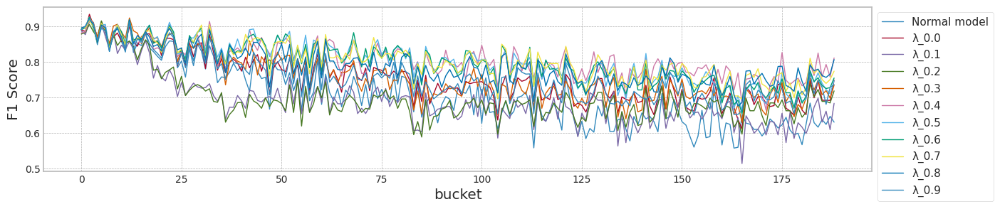

                   lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Case #1, Normal model  0.866667  0.889908  0.704388  0.630137  0.706494
1                     0.0  0.865169  0.889908  0.750987  0.748252  0.695465
2                     0.1  0.879121  0.886878  0.689251  0.683128  0.747425
3                     0.2  0.879121  0.877828  0.697048  0.717949  0.734719
4                     0.3  0.877778  0.889908  0.756519  0.734426  0.721097
5                     0.4  0.874317  0.880734  0.805513  0.810606  0.706068
6                     0.5  0.883978  0.890909  0.799098  0.746667  0.707802
7                     0.6  0.883978  0.890909  0.796173  0.754209  0.703831
8                     0.7  0.877778  0.894977  0.802074  0.773519  0.707836
9                     0.8  0.872928  0.894977  0.788470  0.805970  0.701707
10                    0.9  0.872928  0.889908  0.753801  0.735632  0.698420
max_mean_lambda= 0.4


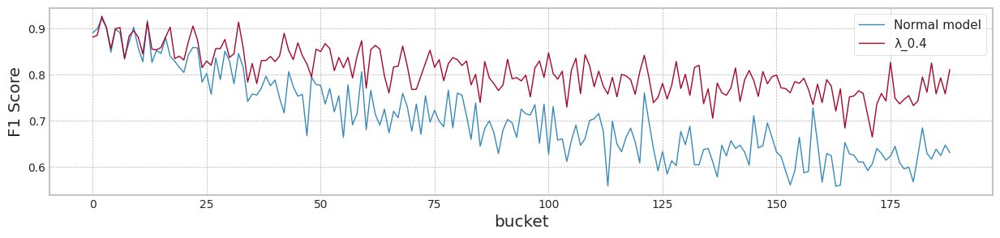

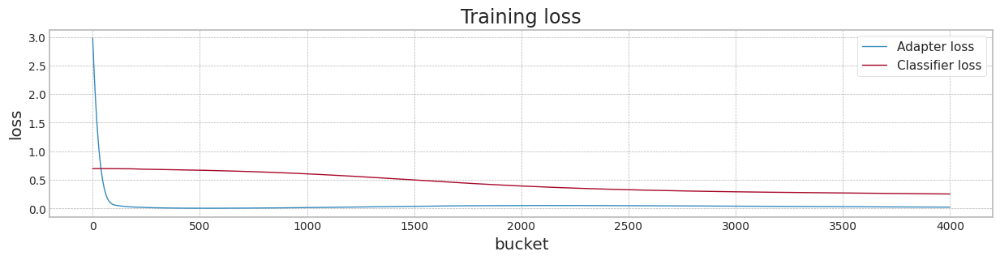

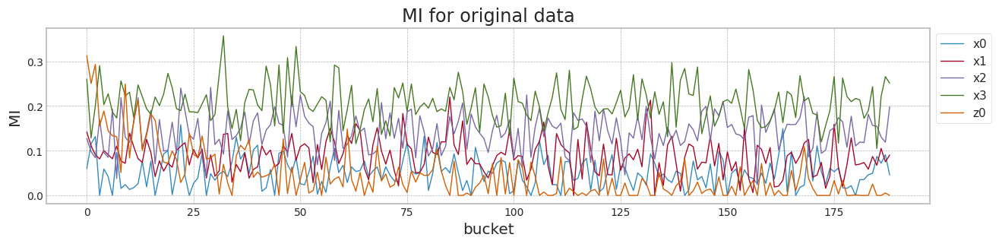

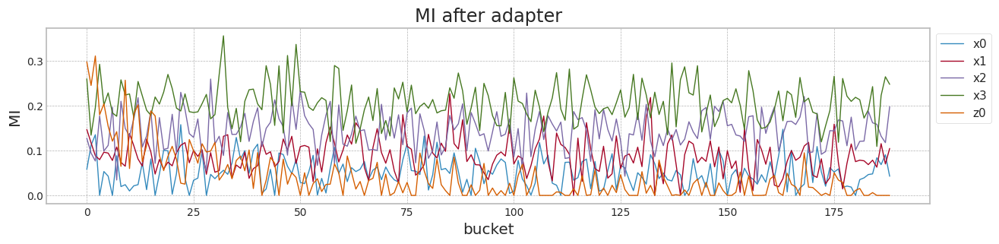

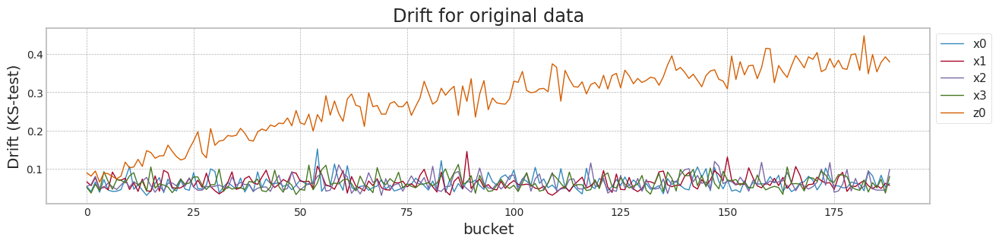

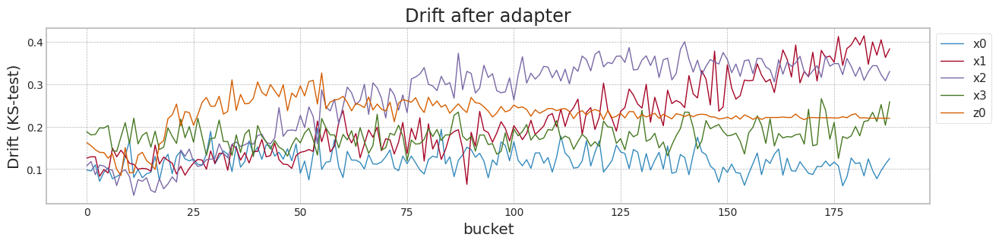

In [33]:
avaible_range = 400
seed = 1
train_tensors = Namespace(XS_train = torch.tensor(X[0:1800].values, dtype=torch.float32),
                          y_train = torch.tensor(y[0:1800], dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X[1800:2000].values, dtype=torch.float32),
                         y_test = torch.tensor(y[1800:2000], dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
lambda_f_set = [-0.1,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9] #[-0.1,0.0,0.5] #
lambda_f_set2 = [1.0]
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2
    print('lambda_f2',lambda_f2)
    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf = test_all_data(last_generator,last_adapter,X[0:1800][['x0','x1','x2','x3','z0']],X[2000:][['x0','x1','x2','x3','z0','b']],y[2000:])
        if lambda_f < 0.0:
            result_table2['lambda'].append("Case #1, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)

    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()


## synthetic data의 생성 (Case #2 MI의 증감(상대적), Drift의 고정)

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature에 대해 y의 비중이 시간에 따라 감소하도록 생성

In [34]:
data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 2.5])

In [35]:
seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

In [36]:
x1.shape

(40000, 5)

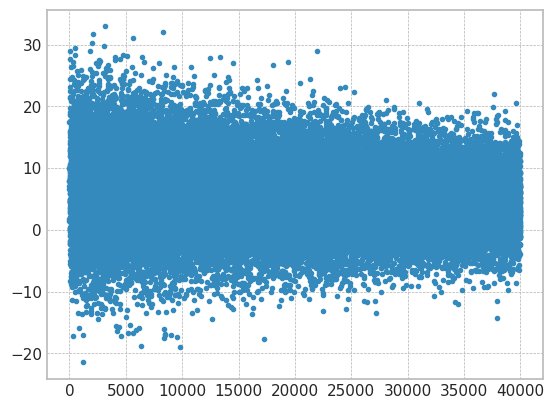

In [37]:
import matplotlib.pyplot as plt

seed_everything()

y1_array = []
cor_const = cor[4]
for ii in range(x1.shape[0]):
    cor[4] = cor[4] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 2.0)
    y1_array.append(np.sum(cor * x1[ii])+e)

plt.plot(y1_array,'.')

In [38]:
m = 5 #np.mean(y1_array[0:2000])
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
print(sum(y1))

5
21325


In [39]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)
mi_scores = make_mi_scores(X1, y1, discrete_features="auto")
print(mi_scores)

x0    0.227465
z0    0.088169
x1    0.018550
x3    0.008429
x2    0.006772
Name: MI Scores, dtype: float64


Bucket size 200 step_size 190


100%|██████████| 190/190 [00:02<00:00, 74.40it/s]


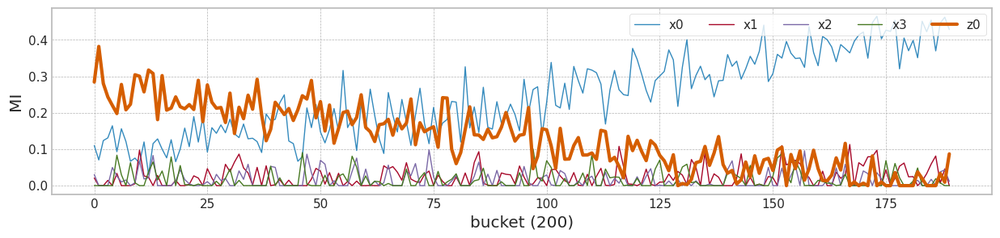

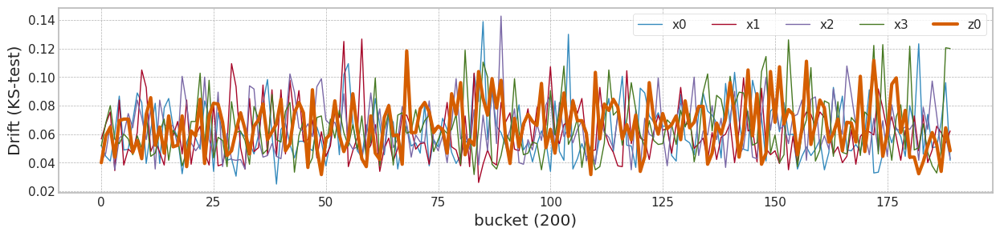

In [40]:
from tqdm import tqdm

bucket_size_array=[200]#[10,50,100,200]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler_c2 = MinMaxScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
X1 = pd.DataFrame(np.concatenate((scaler_c2.fit_transform(X1[0:1800]), scaler_c2.transform(X1[1800:])),axis=0), columns=columns)

for bucket_size in bucket_size_array:
    #bucket_size = 10
    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((x.shape[0]-2000)/bucket_size)
    print('Bucket size',bucket_size,'step_size',step_size)

    for bk in tqdm(range(step_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X1[bk*bucket_size:bk*bucket_size+bucket_size], y1[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X1[0:1800].values,X1[bk*bucket_size+2000:bk*bucket_size+bucket_size+2000].values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)
    plt.figure(figsize=main_figsize)
    plt.plot(df_mis[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_mis['z0'].values,linewidth=3,label='z0')
    plt.ylabel('MI')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

    plt.figure(figsize=main_figsize)
    plt.plot(df_drf[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_drf['z0'].values,linewidth=3,label='z0')
    plt.ylabel('Drift (KS-test)')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

### 학습 및 전체 예측

cuda:0


100%|██████████| 1000/1000 [00:24<00:00, 40.75it/s]


MSE: 0.07
RMSE: 0.26


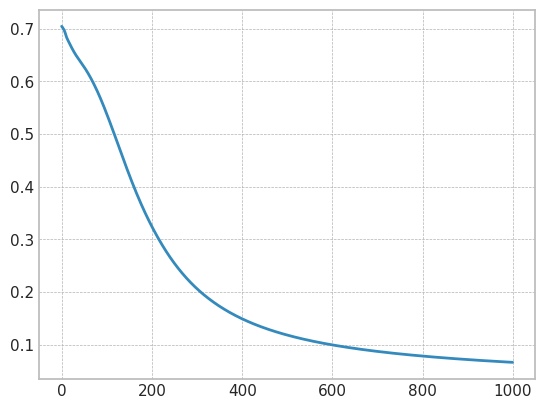

feature 5, test_f1 0.9867841409691629


In [41]:
import copy
import torch.optim as optim

seed_everything()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
# Convert to 2D PyTorch tensors
X_train = torch.tensor(X1[0:1800][['x0','x1','x2','x3','z0']].values, dtype=torch.float32).to(device)
y_train = torch.tensor(y1[0:1800], dtype=torch.float32).reshape(-1, 1).to(device)

X_test = torch.tensor(X1[1800:2000][['x0','x1','x2','x3','z0']].values, dtype=torch.float32).to(device)
y_test = torch.tensor(y1[1800:2000], dtype=torch.float32).reshape(-1, 1).to(device)

# Define the model
model = nn.Sequential(
    nn.Linear(5, 20),
    nn.ReLU(),
    nn.Linear(20, 5),
    nn.ReLU(),
    nn.Linear(5, 1),
    nn.Sigmoid()
).to(device)

# loss function and optimizer
loss_fn = nn.BCELoss()  # mean square error
optimizer = optim.Adam(model.parameters(), lr=0.0001)

n_epochs = 1000   # number of epochs to run
batch_size = 100  # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)

# Hold the best model
best_mse = np.inf   # init to infinity
best_weights = None
history = []

for epoch in tqdm(range(n_epochs)):
    model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    model.eval()
    y_pred = model(X_test)
    mse = loss_fn(y_pred, y_test)
    mse = float(mse)
    history.append(mse)
    if mse < best_mse:
        best_mse = mse
        best_weights = copy.deepcopy(model.state_dict())

# restore model and return best accuracy
model.load_state_dict(best_weights)
print("MSE: %.2f" % best_mse)
print("RMSE: %.2f" % np.sqrt(best_mse))
plt.plot(history)
plt.show()

from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
predicted_y = model(X_test)
f1 = f1_score(y_test.cpu().data.numpy(),(predicted_y.cpu().data.numpy()> 0.5).astype(float))
print('feature 5, test_f1',f1)

100%|██████████| 189/189 [00:00<00:00, 512.03it/s]


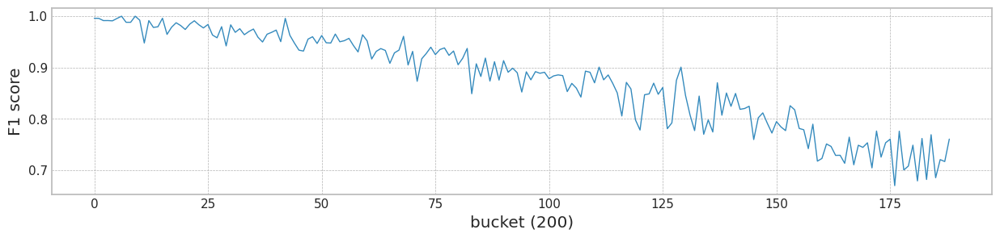

,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,Case #2 Feature 5,0.986784,0.996016,0.87628,0.760684,0.087066


In [42]:
XT = X1[2000:][['x0','x1','x2','x3','z0']]
yT = y1[2000:]

bucket_size_array=[200]

for bucket_size in bucket_size_array:
    bucket_count = int(XT.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(XT[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32).to(device)
        predicted_y = model(tmp_x)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(yT[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)
    plt.figure(figsize=main_figsize)
    plt.plot(f1s,linewidth=1)
    plt.ylabel('F1 score')
    plt.xlabel(f'bucket ({bucket_size})')
    #plt.title('Changes of F1 score according to bucket')
    plt.show()

result_table3 = {}
result_table3['lambda']=[]
result_table3['test_f1']=[]
result_table3['init_f1']=[]
result_table3['mean_f1']=[]
result_table3['last_f1']=[]
result_table3['MI(y^,z)']=[]

result_table3['lambda'].append('Case #2 Feature 5')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['MI(y^,z)'].append(mi_scores['z0'])

pd.DataFrame(result_table3)

In [43]:
X1['b'] = [int(b/100) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.519751,0.468030,0.270011,0.516605,0.339159,0
1,0.605565,0.386136,0.467312,0.549700,0.666164,0
2,0.551222,0.433079,0.644682,0.704678,0.471856,0
3,0.335978,0.625620,0.283118,0.494381,0.609888,0
4,0.496805,0.524298,0.566753,0.426693,0.472373,0
...,...,...,...,...,...,...
39995,0.325122,0.364328,0.241452,0.576603,0.717378,399
39996,0.350268,0.453351,0.284085,0.543373,0.701927,399
39997,0.553850,0.305018,0.504892,0.544244,0.491374,399
39998,0.426469,0.502344,0.239389,0.229965,0.775500,399


cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 0.707444]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.684251]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.660318]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.642272]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.626087]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.607096]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.584608]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.558883]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.530579]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.500473]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.469480]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.438538]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.408405]
[Lambda: -0.

100%|██████████| 189/189 [00:03<00:00, 62.16it/s]


mean of drift:
x0    0.061681
x1    0.060982
x2    0.064253
x3    0.064427
z0    0.065844
dtype: float64
Mean F1 for all data: 0.8586993294097212
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 2.870375] [G loss: 0.705029]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 34.174019] [G loss: 0.662996]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 79.151474] [G loss: 0.548896]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 599.497559] [G loss: 0.256368]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 1263.627930] [G loss: 0.133568]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 1925.736084] [G loss: 0.090558]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 2621.176514] [G loss: 0.068418]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 3384.317383] [G loss: 0.054226]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 4116.922852] [G loss: 0.044539]
[Lambda: 0.000000] [Epoch 1800/4000] [a loss: 4701.370117] [G loss: 0.037662]
[Lambda: 0.000000] [Epoch 2000/4000] [a loss: 5258.769043] [G loss: 0.032473]
[Lam

100%|██████████| 189/189 [00:03<00:00, 60.30it/s]


mean of drift:
x0    0.999656
x1    0.934286
x2    1.000000
x3    1.000000
z0    0.930165
dtype: float64
Mean F1 for all data: 0.8809434779632576
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 2.870375] [G loss: 0.705029]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 0.025864] [G loss: 0.693405]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.041895] [G loss: 0.657561]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.152004] [G loss: 0.606098]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.250327] [G loss: 0.547404]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.310901] [G loss: 0.486712]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.363894] [G loss: 0.426958]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.407754] [G loss: 0.370101]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.431318] [G loss: 0.321336]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.440471] [G loss: 0.280737]
[Lambda: 0.100000] [Epoch 2000/4000] [a loss: 0.440496] [G loss: 0.247216]
[Lambda: 0.100000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 57.42it/s]


mean of drift:
x0    0.951678
x1    0.703189
x2    0.598804
x3    0.212575
z0    0.581728
dtype: float64
Mean F1 for all data: 0.13318976133846444
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 2.870375] [G loss: 0.705029]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 0.020614] [G loss: 0.694503]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.011370] [G loss: 0.663055]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.038617] [G loss: 0.629843]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.073197] [G loss: 0.594050]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.105238] [G loss: 0.551962]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.123898] [G loss: 0.509755]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.141290] [G loss: 0.464534]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.159622] [G loss: 0.410024]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.167921] [G loss: 0.361944]
[Lambda: 0.200000] [Epoch 2000/4000] [a loss: 0.176633] [G loss: 0.318635]
[Lambda: 0.200000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 60.49it/s]


mean of drift:
x0    0.942813
x1    0.501505
x2    0.349815
x3    0.084153
z0    0.665897
dtype: float64
Mean F1 for all data: 0.1336241073660811
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 2.870375] [G loss: 0.705029]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 0.020097] [G loss: 0.694825]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.006138] [G loss: 0.665459]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.014332] [G loss: 0.639341]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.029316] [G loss: 0.611970]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.045678] [G loss: 0.578289]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.058035] [G loss: 0.542776]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.068446] [G loss: 0.505967]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.076665] [G loss: 0.466462]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.082722] [G loss: 0.426397]
[Lambda: 0.300000] [Epoch 2000/4000] [a loss: 0.087808] [G loss: 0.389733]
[Lambda: 0.300000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 57.09it/s]


mean of drift:
x0    0.935902
x1    0.144862
x2    0.129386
x3    0.083098
z0    0.637675
dtype: float64
Mean F1 for all data: 0.13371231563445493
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 2.870375] [G loss: 0.705029]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 0.020017] [G loss: 0.694989]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.004586] [G loss: 0.666913]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.006374] [G loss: 0.644440]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.012772] [G loss: 0.623123]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.021608] [G loss: 0.594448]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.029913] [G loss: 0.561163]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.036363] [G loss: 0.526253]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.042125] [G loss: 0.490100]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.046590] [G loss: 0.454185]
[Lambda: 0.400000] [Epoch 2000/4000] [a loss: 0.050548] [G loss: 0.416153]
[Lambda: 0.400000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 59.55it/s]


mean of drift:
x0    0.913119
x1    0.194935
x2    0.073698
x3    0.093489
z0    0.440923
dtype: float64
Mean F1 for all data: 0.1559992154061796
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 2.870375] [G loss: 0.705029]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 0.020028] [G loss: 0.695084]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.004008] [G loss: 0.667913]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.003171] [G loss: 0.647591]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.005842] [G loss: 0.630359]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.010293] [G loss: 0.606504]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.015128] [G loss: 0.576495]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.019712] [G loss: 0.543068]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.023559] [G loss: 0.508184]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.026695] [G loss: 0.472957]
[Lambda: 0.500000] [Epoch 2000/4000] [a loss: 0.029265] [G loss: 0.438077]
[Lambda: 0.500000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 59.26it/s]


mean of drift:
x0    0.897037
x1    0.103959
x2    0.089297
x3    0.082710
z0    0.399668
dtype: float64
Mean F1 for all data: 0.17073967724085978
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 2.870375] [G loss: 0.705029]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 0.020059] [G loss: 0.695177]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.003785] [G loss: 0.668645]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.001649] [G loss: 0.649831]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.002692] [G loss: 0.635299]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.004664] [G loss: 0.615460]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.007235] [G loss: 0.589137]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.010005] [G loss: 0.558130]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.012547] [G loss: 0.524655]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.014683] [G loss: 0.490341]
[Lambda: 0.600000] [Epoch 2000/4000] [a loss: 0.016578] [G loss: 0.455909]
[Lambda: 0.600000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 61.66it/s]


mean of drift:
x0    0.445976
x1    0.081526
x2    0.076761
x3    0.081817
z0    0.375914
dtype: float64
Mean F1 for all data: 0.9037283226062182
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 2.870375] [G loss: 0.705029]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 0.020093] [G loss: 0.695223]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.003718] [G loss: 0.669193]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.000925] [G loss: 0.651462]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.001238] [G loss: 0.638805]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.001986] [G loss: 0.621999]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.003148] [G loss: 0.599173]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.004511] [G loss: 0.571500]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.005980] [G loss: 0.540192]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.007372] [G loss: 0.506980]
[Lambda: 0.700000] [Epoch 2000/4000] [a loss: 0.008428] [G loss: 0.473663]
[Lambda: 0.700000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 59.81it/s]


mean of drift:
x0    0.279051
x1    0.096690
x2    0.094350
x3    0.080688
z0    0.200688
dtype: float64
Mean F1 for all data: 0.9084679207726476
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 2.870375] [G loss: 0.705029]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 0.020125] [G loss: 0.695259]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.003723] [G loss: 0.669600]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.000578] [G loss: 0.652721]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.000522] [G loss: 0.641514]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.000755] [G loss: 0.626838]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.001145] [G loss: 0.607092]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.001651] [G loss: 0.582650]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.002227] [G loss: 0.554713]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.002877] [G loss: 0.524000]
[Lambda: 0.800000] [Epoch 2000/4000] [a loss: 0.003501] [G loss: 0.491880]
[Lambda: 0.800000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 57.58it/s]


mean of drift:
x0    0.137349
x1    0.108704
x2    0.112646
x3    0.079824
z0    0.157407
dtype: float64
Mean F1 for all data: 0.8945293676080766
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 2.870375] [G loss: 0.705029]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 0.020155] [G loss: 0.695288]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.003761] [G loss: 0.669960]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.000432] [G loss: 0.653809]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000234] [G loss: 0.643611]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000228] [G loss: 0.630761]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.000295] [G loss: 0.613423]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.000403] [G loss: 0.591771]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.000525] [G loss: 0.566886]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.000661] [G loss: 0.539558]
[Lambda: 0.900000] [Epoch 2000/4000] [a loss: 0.000803] [G loss: 0.510478]
[Lambda: 0.900000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 60.36it/s]


mean of drift:
x0    0.130282
x1    0.122828
x2    0.118128
x3    0.079189
z0    0.131778
dtype: float64
Mean F1 for all data: 0.8344482790171245


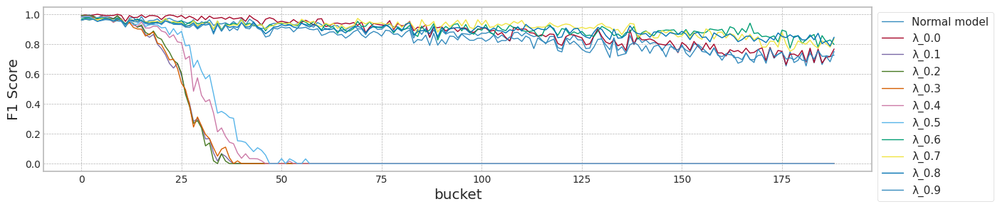

                   lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Case #1, Normal model  0.961702  0.984127  0.858699  0.726496  0.400497
1                     0.0  0.991150  0.992000  0.880943  0.767773  0.390417
2                     0.1  0.973913  0.992000  0.133190  0.000000  0.395847
3                     0.2  0.973913  0.992000  0.133624  0.000000  0.394924
4                     0.3  0.965812  0.979920  0.133712  0.000000  0.408698
5                     0.4  0.961702  0.980080  0.155999  0.000000  0.402670
6                     0.5  0.961702  0.980080  0.170740  0.000000  0.409297
7                     0.6  0.961702  0.968254  0.903728  0.797688  0.409914
8                     0.7  0.961702  0.960630  0.908468  0.836957  0.404332
9                     0.8  0.957627  0.960630  0.894529  0.846473  0.399195
10                    0.9  0.953586  0.960630  0.834448  0.751825  0.401160
max_mean_lambda= 0.7


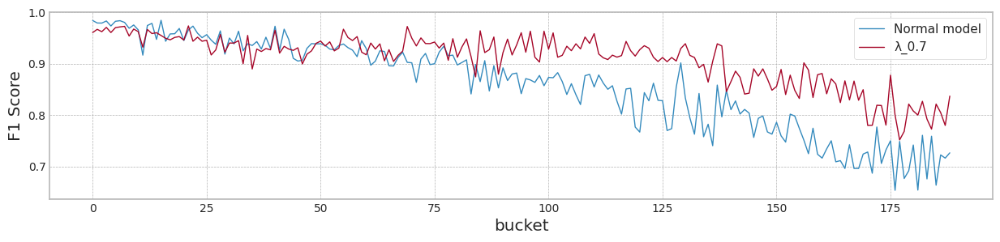

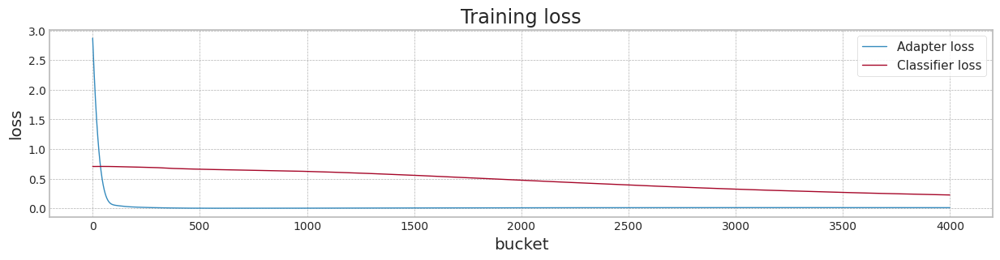

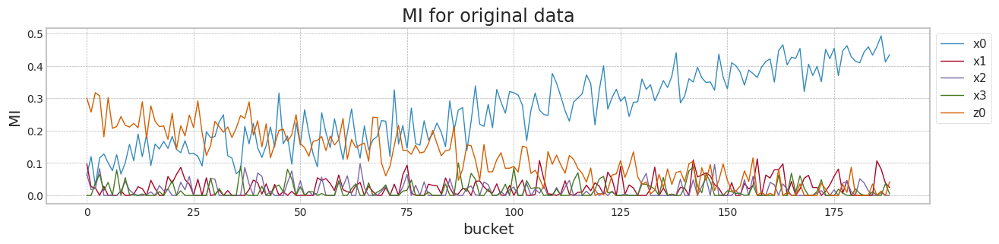

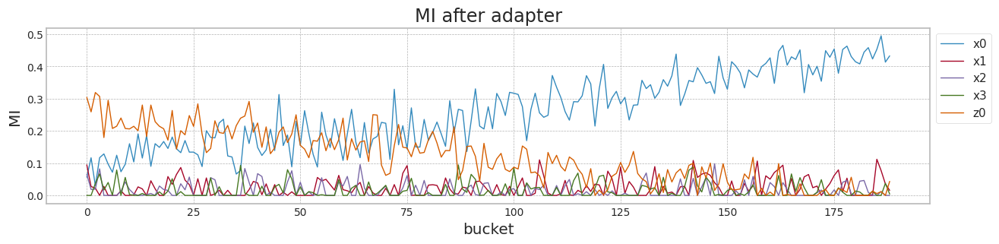

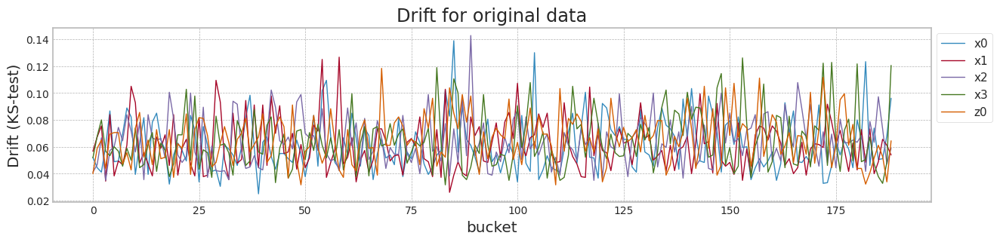

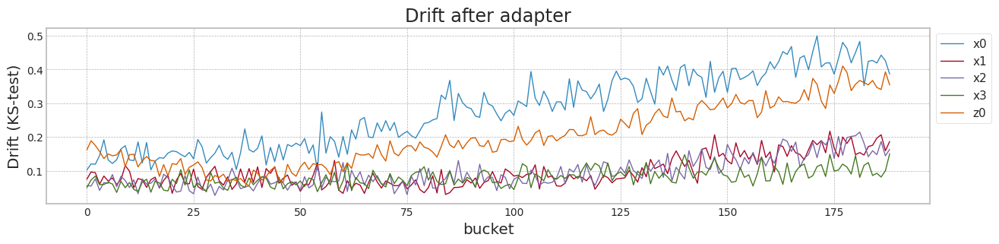

In [44]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X1[0:1800].values, dtype=torch.float32),
                          y_train = torch.tensor(y1[0:1800], dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X1[1800:2000].values, dtype=torch.float32),
                         y_test = torch.tensor(y1[1800:2000], dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [-0.1, 0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.4,0.5]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.



#lambda_f_set2 = [0.0000089,0.0000090,0.0000091]
lambda_f_set2 = [1.0]
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2

    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf  = test_all_data(last_generator,last_adapter,
                                           X1[0:1800][['x0','x1','x2','x3','z0']],
                                           X1[2000:],
                                           y1[2000:])

        if lambda_f < 0.0:
            result_table2['lambda'].append("Case #1, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)

    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

## synthetic data의 생성 (Case #3 MI의 증감(상대적), Drift의 증가)

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift, MI는 고정

### data 생성

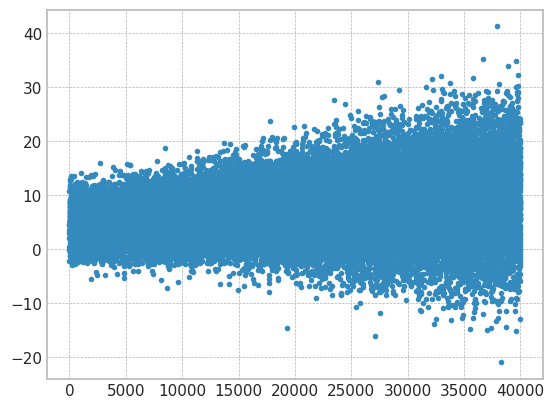

In [59]:
import matplotlib.pyplot as plt

seed_everything(2)

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 0.5])

x2 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x2[:,ix] = np.random.normal(1,cor_,data_size)

y2_array = []
cor_const = 3/x2.shape[0]
for ii in range(x2.shape[0]):
    e = np.random.normal(0.0+10*ii/40000, 5*cor_const * ii)
    e1 = 0.0 #np.random.normal(0.0, cor_const * ii)
    x2[ii,4] = x2[ii,4] + e
    y2_array.append(np.sum(cor * x2[ii])+e1)

plt.plot(y2_array,'.')

In [60]:
m = 5 #np.mean(y2_array)
print(m)
y2 = [1 if y_ > m else 0 for y_ in y2_array]
sum(y2)

5


26135

In [61]:
columns=['x0','x1','x2','x3','z0']
X2 = pd.DataFrame(x2,columns=columns)
mi_scores = make_mi_scores(X2, y2, discrete_features="auto")
print(mi_scores)

z0    0.224867
x0    0.087966
x1    0.031938
x2    0.010245
x3    0.001907
Name: MI Scores, dtype: float64


Bucket size 200 step_size 190


100%|██████████| 200/200 [00:02<00:00, 73.53it/s]


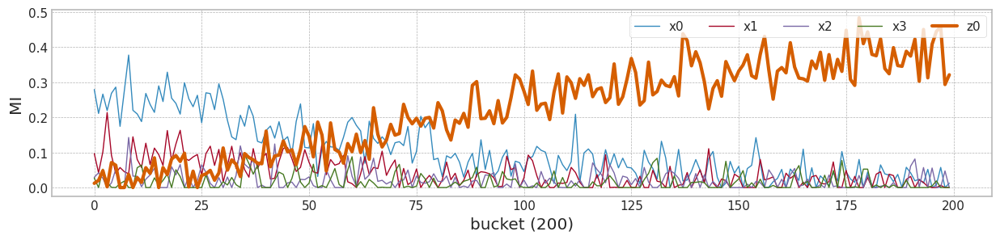

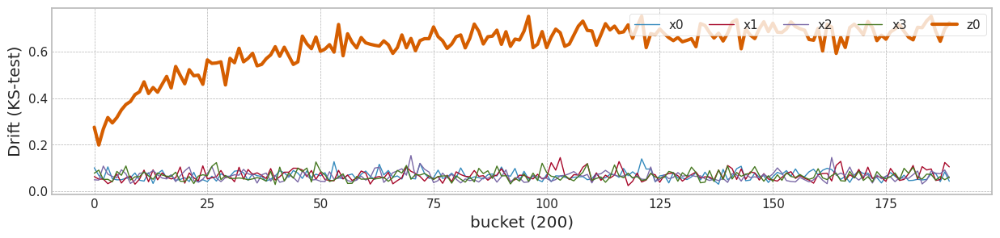

In [62]:
from tqdm import tqdm

bucket_size_array=[200]#[10,50,100,200]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
'''
scaler_c3 = StandardScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
X2 = pd.DataFrame(np.concatenate((scaler_c3.fit_transform(X2[0:1800]), scaler_c3.transform(X2[1800:])),axis=0), columns=columns)
'''
for bucket_size in bucket_size_array:
    #bucket_size = 10

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((X2.shape[0]-2000)/bucket_size)
    print('Bucket size',bucket_size,'step_size',step_size)
    for bk in tqdm(range(bucket_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X2[bk*bucket_size:bk*bucket_size+bucket_size], y2[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X2[0:1800].values,X2[bk*bucket_size+2000:bk*bucket_size+bucket_size+2000].values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    '''
    df_mis['x0'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x1'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x2'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['x3'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    df_mis['z0'].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=10)
    plt.show()
    '''
    plt.figure(figsize=main_figsize)
    plt.plot(df_mis[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_mis['z0'].values,linewidth=3,label='z0')
    plt.ylabel('MI')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

    plt.figure(figsize=main_figsize)
    plt.plot(df_drf[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_drf['z0'].values,linewidth=3,label='z0')
    plt.ylabel('Drift (KS-test)')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

### 학습 및 전체 예측

#### concept drift tolerant 학습

In [63]:
X2['b'] = [int(b/100) for b in X2.index.values]
X2

,x0,x1,x2,x3,z0,b
0,0.374863,-1.631348,0.402315,2.034420,0.234180,0
1,0.915600,1.426389,0.828936,0.880705,0.590846,0
2,-2.204294,0.529797,0.275024,0.250469,0.297681,0
3,3.460406,2.383576,1.788045,0.707186,1.415944,0
4,-1.690153,1.036373,0.147557,1.113972,0.375048,0
...,...,...,...,...,...,...
39995,-0.403808,1.761956,0.330192,1.256819,16.223595,399
39996,0.254364,2.391830,0.630682,0.345254,2.794898,399
39997,0.139385,1.201390,-1.015328,0.740202,29.432893,399
39998,0.347711,1.943623,2.942906,1.648642,-7.265632,399


cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 0.679647]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.638235]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.591101]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.536859]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.478337]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.421566]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.371491]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.330044]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.296554]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.268833]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.245355]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.224920]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.206675]
[Lambda: -0.

100%|██████████| 189/189 [00:03<00:00, 61.40it/s]


mean of drift:
x0    0.066817
x1    0.067307
x2    0.063521
x3    0.065220
z0    0.622810
dtype: float64
Mean F1 for all data: 0.8775311021271712
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 15.779007] [G loss: 0.690853]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 230.590240] [G loss: 0.491621]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 1000.679749] [G loss: 0.244048]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 2444.715820] [G loss: 0.100564]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 3940.401611] [G loss: 0.060241]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 5337.884277] [G loss: 0.043052]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 6824.080078] [G loss: 0.032588]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 8260.000977] [G loss: 0.025951]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 9770.332031] [G loss: 0.020997]
[Lambda: 0.000000] [Epoch 1800/4000] [a loss: 11264.984375] [G loss: 0.017045]
[Lambda: 0.000000] [Epoch 2000/4000] [a loss: 12723.361328] [G loss: 0.01394

100%|██████████| 189/189 [00:03<00:00, 54.95it/s]


mean of drift:
x0    0.509248
x1    0.538304
x2    0.983066
x3    0.999788
z0    0.650779
dtype: float64
Mean F1 for all data: 0.9207541421627489
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 15.779007] [G loss: 0.690853]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 0.022416] [G loss: 0.633926]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.027614] [G loss: 0.582206]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.056310] [G loss: 0.525028]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.099451] [G loss: 0.452671]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.126641] [G loss: 0.387284]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.139366] [G loss: 0.333547]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.146575] [G loss: 0.291129]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.150612] [G loss: 0.257781]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.151127] [G loss: 0.231199]
[Lambda: 0.100000] [Epoch 2000/4000] [a loss: 0.149704] [G loss: 0.209534]
[Lambda: 0.100000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 55.34it/s]


mean of drift:
x0    0.463154
x1    0.194198
x2    0.392963
x3    0.357016
z0    0.578821
dtype: float64
Mean F1 for all data: 0.47028252545587823
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 15.779007] [G loss: 0.690853]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 0.017915] [G loss: 0.635347]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.006804] [G loss: 0.586043]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.012261] [G loss: 0.533393]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.021921] [G loss: 0.467228]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.029079] [G loss: 0.404365]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.033209] [G loss: 0.351278]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.035304] [G loss: 0.309043]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.036475] [G loss: 0.275604]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.037245] [G loss: 0.248473]
[Lambda: 0.200000] [Epoch 2000/4000] [a loss: 0.036639] [G loss: 0.225858]
[Lambda: 0.200000] [Epoch 2

100%|██████████| 189/189 [00:03<00:00, 57.69it/s]


mean of drift:
x0    0.126975
x1    0.178695
x2    0.294515
x3    0.185608
z0    0.591634
dtype: float64
Mean F1 for all data: 0.7349712432976232
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 15.779007] [G loss: 0.690853]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 0.017610] [G loss: 0.635898]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.003328] [G loss: 0.587367]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.004618] [G loss: 0.536319]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.007917] [G loss: 0.472569]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.010674] [G loss: 0.410954]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.012225] [G loss: 0.358491]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.013108] [G loss: 0.316341]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.013502] [G loss: 0.282973]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.013759] [G loss: 0.255802]
[Lambda: 0.300000] [Epoch 2000/4000] [a loss: 0.013651] [G loss: 0.232784]
[Lambda: 0.300000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 59.29it/s]


mean of drift:
x0    0.103469
x1    0.126990
x2    0.189409
x3    0.085412
z0    0.598369
dtype: float64
Mean F1 for all data: 0.8226829057035151
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 15.779007] [G loss: 0.690853]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 0.017713] [G loss: 0.636178]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.002294] [G loss: 0.588027]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.002272] [G loss: 0.537800]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.003503] [G loss: 0.475363]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.004691] [G loss: 0.414506]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.005387] [G loss: 0.362384]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.005749] [G loss: 0.320377]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.005918] [G loss: 0.287019]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.006034] [G loss: 0.259809]
[Lambda: 0.400000] [Epoch 2000/4000] [a loss: 0.005988] [G loss: 0.236659]
[Lambda: 0.400000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 59.66it/s]


mean of drift:
x0    0.092881
x1    0.097910
x2    0.110265
x3    0.094186
z0    0.608272
dtype: float64
Mean F1 for all data: 0.858342101725027
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 15.779007] [G loss: 0.690853]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 0.017856] [G loss: 0.636353]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.001896] [G loss: 0.588416]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.001348] [G loss: 0.538695]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.001753] [G loss: 0.477129]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.002239] [G loss: 0.416797]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.002537] [G loss: 0.364923]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.002695] [G loss: 0.322978]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.002759] [G loss: 0.289635]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.002799] [G loss: 0.262426]
[Lambda: 0.500000] [Epoch 2000/4000] [a loss: 0.002802] [G loss: 0.239191]
[Lambda: 0.500000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 57.98it/s]


mean of drift:
x0    0.084165
x1    0.086329
x2    0.088131
x3    0.099524
z0    0.617199
dtype: float64
Mean F1 for all data: 0.8798020361892068
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 15.779007] [G loss: 0.690853]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 0.017987] [G loss: 0.636468]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.001725] [G loss: 0.588673]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.000936] [G loss: 0.539285]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.000971] [G loss: 0.478282]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.001127] [G loss: 0.418324]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.001233] [G loss: 0.366645]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.001292] [G loss: 0.324773]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.001313] [G loss: 0.291445]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.001331] [G loss: 0.264233]
[Lambda: 0.600000] [Epoch 2000/4000] [a loss: 0.001329] [G loss: 0.240970]
[Lambda: 0.600000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 58.79it/s]


mean of drift:
x0    0.079662
x1    0.078045
x2    0.079333
x3    0.094536
z0    0.620364
dtype: float64
Mean F1 for all data: 0.8819293269525563
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 15.779007] [G loss: 0.690853]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 0.018096] [G loss: 0.636550]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.001647] [G loss: 0.588866]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.000743] [G loss: 0.539703]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.000605] [G loss: 0.479096]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.000605] [G loss: 0.419417]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.000618] [G loss: 0.367891]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.000625] [G loss: 0.326085]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.000621] [G loss: 0.292778]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.000618] [G loss: 0.265576]
[Lambda: 0.700000] [Epoch 2000/4000] [a loss: 0.000611] [G loss: 0.242307]
[Lambda: 0.700000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 59.36it/s]


mean of drift:
x0    0.077551
x1    0.071132
x2    0.071990
x3    0.086837
z0    0.620929
dtype: float64
Mean F1 for all data: 0.8830773895973663
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 15.779007] [G loss: 0.690853]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 0.018187] [G loss: 0.636611]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.001610] [G loss: 0.589029]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.000656] [G loss: 0.540007]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.000439] [G loss: 0.479702]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.000368] [G loss: 0.420220]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.000337] [G loss: 0.368803]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.000317] [G loss: 0.327056]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.000299] [G loss: 0.293774]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.000285] [G loss: 0.266583]
[Lambda: 0.800000] [Epoch 2000/4000] [a loss: 0.000272] [G loss: 0.243324]
[Lambda: 0.800000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 60.00it/s]


mean of drift:
x0    0.072396
x1    0.065964
x2    0.067307
x3    0.076102
z0    0.621335
dtype: float64
Mean F1 for all data: 0.8781420942010058
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 15.779007] [G loss: 0.690853]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 0.018264] [G loss: 0.636661]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.001596] [G loss: 0.589177]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.000618] [G loss: 0.540268]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000368] [G loss: 0.480224]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000269] [G loss: 0.420898]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.000220] [G loss: 0.369564]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.000190] [G loss: 0.327856]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.000167] [G loss: 0.294582]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.000149] [G loss: 0.267390]
[Lambda: 0.900000] [Epoch 2000/4000] [a loss: 0.000133] [G loss: 0.244137]
[Lambda: 0.900000] [Epoch 22

100%|██████████| 189/189 [00:03<00:00, 55.45it/s]


mean of drift:
x0    0.071261
x1    0.064782
x2    0.064888
x3    0.068004
z0    0.621531
dtype: float64
Mean F1 for all data: 0.8751442915590387


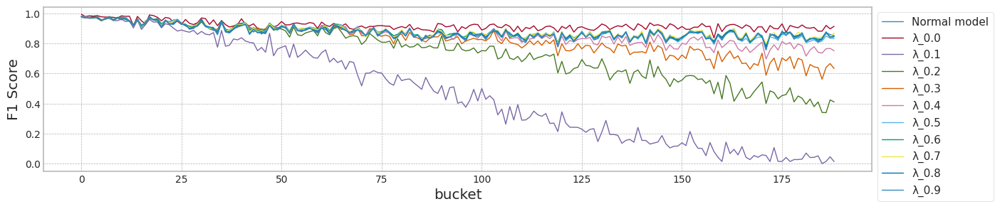

                   lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Case #3, Normal model  0.975845  0.980198  0.877531  0.852830  0.397430
1                     0.0  0.990291  0.994975  0.920754  0.914894  0.407132
2                     0.1  0.966184  0.975124  0.470283  0.013158  0.380713
3                     0.2  0.961165  0.980198  0.734971  0.410526  0.384823
4                     0.3  0.975845  0.980198  0.822683  0.633484  0.386093
5                     0.4  0.975845  0.980198  0.858342  0.752066  0.387040
6                     0.5  0.975845  0.980198  0.879802  0.832061  0.387803
7                     0.6  0.975845  0.980198  0.881929  0.849624  0.388832
8                     0.7  0.975845  0.980198  0.883077  0.870849  0.392520
9                     0.8  0.975845  0.980198  0.878142  0.845283  0.392587
10                    0.9  0.975845  0.980198  0.875144  0.845283  0.395018
max_mean_lambda= 0.0


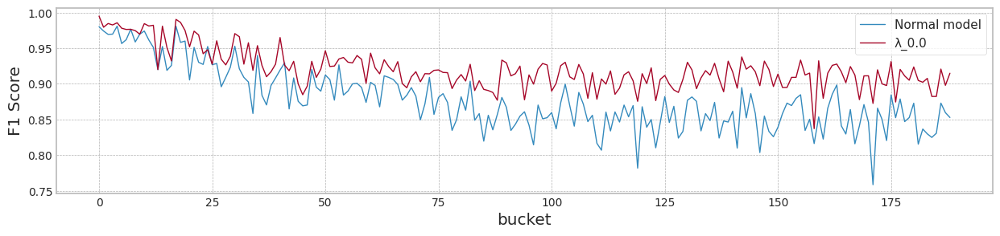

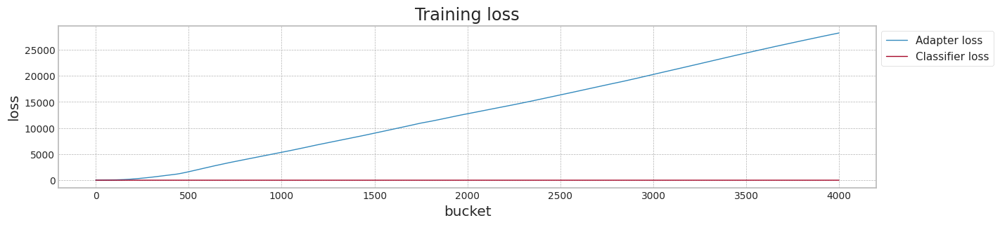

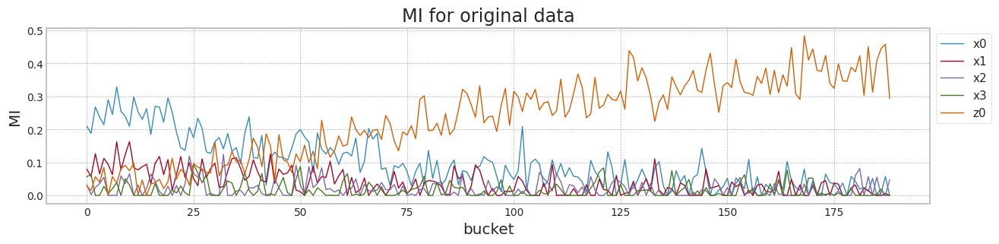

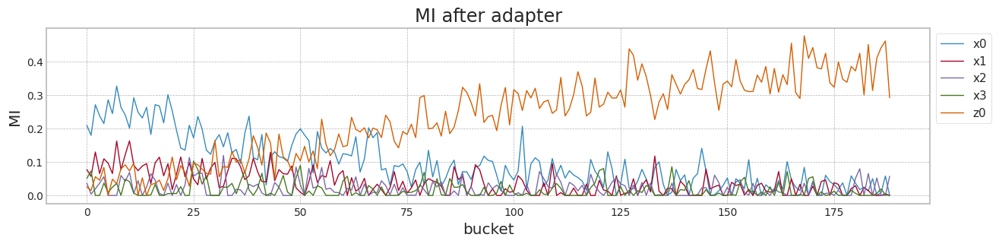

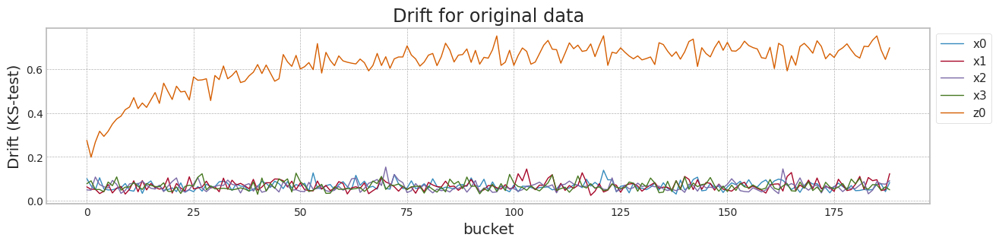

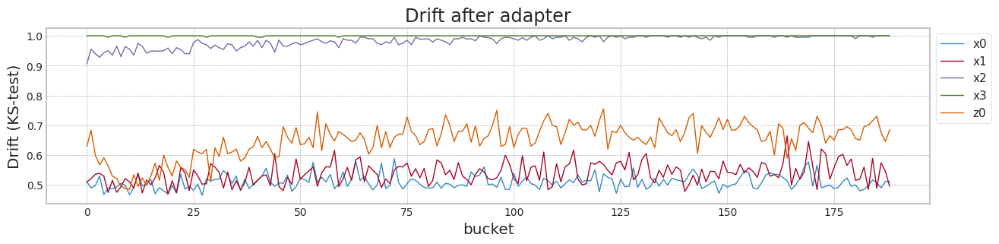

In [64]:

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X2[0:1800].values, dtype=torch.float32),
                          y_train = torch.tensor(y2[0:1800], dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X2[1800:2000].values, dtype=torch.float32),
                         y_test = torch.tensor(y2[1800:2000], dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [-0.1,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.4,0.5]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.



#lambda_f_set2 = [0.0000089,0.0000090,0.0000091]
lambda_f_set2 = [1.0]
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2

    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf = test_all_data(last_generator,last_adapter,
                                          X2[0:1800][['x0','x1','x2','x3','z0']],
                                          X2[2000:],
                                          y2[2000:])

        if lambda_f < 0.0:
            result_table2['lambda'].append("Case #3, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)


    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)


    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df[1:]['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

## synthetic data의 생성 (Case #4 MI의 고정, Drift의 증가)

### data 생성 (Test)

In [66]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 0.5])

y3= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x3 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    '''
    x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)
    '''
    # z0
    if ix == 4:
        for ii in range(len(y3)):
            x3[ii,ix] = y3[ii] + np.random.normal(0.0 + 4*ii/data_size,cor_)
    else:
        x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)


In [67]:
columns=['x0','x1','x2','x3','z0']
X3 = pd.DataFrame(x3,columns=columns)
mi_scores = make_mi_scores(X3, y3, discrete_features="auto")
print(mi_scores)

x3    0.202783
x2    0.134082
z0    0.091439
x1    0.079411
x0    0.050887
Name: MI Scores, dtype: float64


Bucket size 200 step_size 190


100%|██████████| 190/190 [00:02<00:00, 73.54it/s]


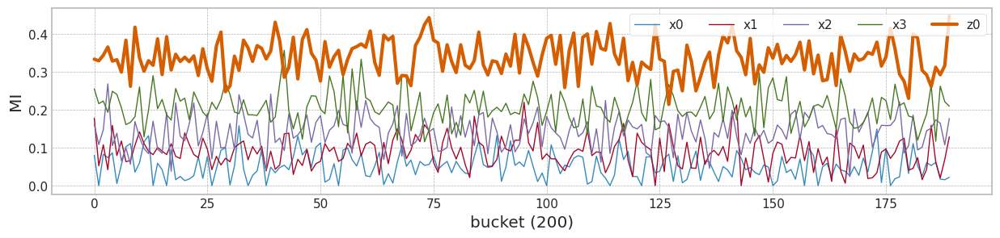

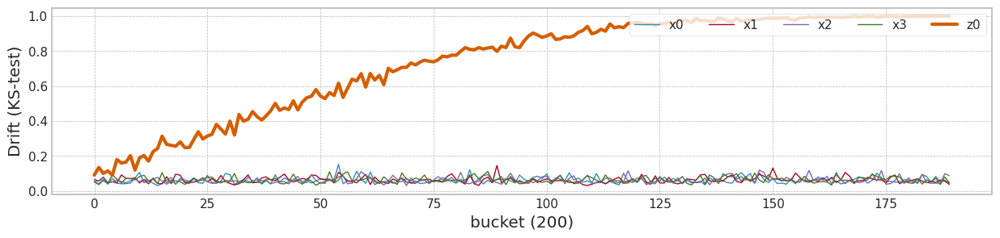

In [68]:
from tqdm import tqdm

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

bucket_size_array=[200]#[10,50,100,200]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler_c4 = StandardScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
scaler_c4.fit(X3[0:1800])
#X3 = pd.DataFrame(np.concatenate((scaler_c4.transform(X3[0:1800]), scaler_c4.transform(X3[1800:])),axis=0), columns=columns)
X3 = pd.DataFrame(scaler_c4.transform(X3), columns=columns)

for bucket_size in bucket_size_array:
    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((x3.shape[0]-2000)/bucket_size)

    print('Bucket size',bucket_size,'step_size',step_size)

    for bk in tqdm(range(step_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X3[bk*bucket_size:bk*bucket_size+bucket_size], y3[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X3[0:1800].values,X3[bk*bucket_size+2000:bk*bucket_size+bucket_size+2000].values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    plt.figure(figsize=main_figsize)
    plt.plot(df_mis[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_mis['z0'].values,linewidth=3,label='z0')
    plt.ylabel('MI')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

    plt.figure(figsize=main_figsize)
    plt.plot(df_drf[['x0','x1','x2','x3']].values,linewidth=1,label=['x0','x1','x2','x3'])
    plt.plot(df_drf['z0'].values,linewidth=3,label='z0')
    plt.ylabel('Drift (KS-test)')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

### 내성학습의 적용

In [69]:
X3['b'] = [int(b/100) for b in X3.index.values]
X3

,x0,x1,x2,x3,z0,b
0,0.470248,-0.657094,0.644936,-0.385024,0.289038,0
1,-0.098493,0.586148,0.837920,1.355031,1.004828,0
2,0.227515,1.703803,1.741631,0.321081,-0.583820,0
3,0.936628,-1.340995,-0.438504,-0.137903,-0.539317,0
4,0.861016,1.212753,0.120639,0.323837,1.138146,0
...,...,...,...,...,...,...
39995,-0.878001,-1.603546,0.040948,0.434072,3.908024,399
39996,-0.259746,-1.334902,-0.152821,0.351855,4.017011,399
39997,-0.661842,0.822949,0.806100,0.424942,6.259142,399
39998,0.080499,-1.616542,-1.980372,0.743351,5.036251,399


cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 0.697719]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.662210]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.593723]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.502838]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.417379]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.346459]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.293216]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.255307]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.229146]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.211322]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.199097]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.190744]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.185021]
[Lambda: -0.

100%|██████████| 189/189 [00:03<00:00, 61.71it/s]


mean of drift:
x0    0.061049
x1    0.062651
x2    0.061975
x3    0.063260
z0    0.734850
dtype: float64
Mean F1 for all data: 0.7391672404203216
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 6.521307] [G loss: 0.695157]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 93.286499] [G loss: 0.484207]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 457.110901] [G loss: 0.225084]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 748.228882] [G loss: 0.185552]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 878.989990] [G loss: 0.178741]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 938.887573] [G loss: 0.175439]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 955.630066] [G loss: 0.173816]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 968.763245] [G loss: 0.172768]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 983.097717] [G loss: 0.171960]
[Lambda: 0.000000] [Epoch 1800/4000] [a loss: 1001.388000] [G loss: 0.171198]
[Lambda: 0.000000] [Epoch 2000/4000] [a loss: 1020.823181] [G loss: 0.170472]
[Lambda:

100%|██████████| 189/189 [00:03<00:00, 57.07it/s]


mean of drift:
x0    1.000000
x1    0.999903
x2    0.959250
x3    0.614318
z0    0.865353
dtype: float64
Mean F1 for all data: 0.7636979120725571
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 6.521307] [G loss: 0.695157]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 0.039168] [G loss: 0.653291]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.065396] [G loss: 0.568994]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.109715] [G loss: 0.462546]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.128706] [G loss: 0.373568]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.123089] [G loss: 0.308357]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.103856] [G loss: 0.263968]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.083472] [G loss: 0.234171]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.065185] [G loss: 0.214127]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.050003] [G loss: 0.200521]
[Lambda: 0.100000] [Epoch 2000/4000] [a loss: 0.038357] [G loss: 0.191084]
[Lambda: 0.100000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 60.21it/s]


mean of drift:
x0    0.405802
x1    0.264638
x2    0.197014
x3    0.263298
z0    0.710329
dtype: float64
Mean F1 for all data: 0.7438694443337746
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 6.521307] [G loss: 0.695157]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 0.021891] [G loss: 0.656096]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.015676] [G loss: 0.577966]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.024483] [G loss: 0.477528]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.030274] [G loss: 0.389632]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.029969] [G loss: 0.322226]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.026330] [G loss: 0.274274]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.021359] [G loss: 0.241487]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.016809] [G loss: 0.219192]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.013012] [G loss: 0.203977]
[Lambda: 0.200000] [Epoch 2000/4000] [a loss: 0.009987] [G loss: 0.193560]
[Lambda: 0.200000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 54.80it/s]


mean of drift:
x0    0.167366
x1    0.145805
x2    0.133865
x3    0.183613
z0    0.694318
dtype: float64
Mean F1 for all data: 0.7569758436851368
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 6.521307] [G loss: 0.695157]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 0.018795] [G loss: 0.657068]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.007328] [G loss: 0.580980]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.009286] [G loss: 0.482944]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.011245] [G loss: 0.396054]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.011231] [G loss: 0.328015]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.009922] [G loss: 0.278900]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.008161] [G loss: 0.244869]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.006500] [G loss: 0.221593]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.005083] [G loss: 0.205730]
[Lambda: 0.300000] [Epoch 2000/4000] [a loss: 0.003914] [G loss: 0.194855]
[Lambda: 0.300000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 58.69it/s]


mean of drift:
x0    0.115370
x1    0.096305
x2    0.104392
x3    0.148480
z0    0.687404
dtype: float64
Mean F1 for all data: 0.7597065204840929
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 6.521307] [G loss: 0.695157]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 0.017773] [G loss: 0.657551]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.004755] [G loss: 0.582470]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.004483] [G loss: 0.485735]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.005088] [G loss: 0.399484]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.005004] [G loss: 0.331223]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.004454] [G loss: 0.281476]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.003647] [G loss: 0.246804]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.002932] [G loss: 0.223024]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.002287] [G loss: 0.206798]
[Lambda: 0.400000] [Epoch 2000/4000] [a loss: 0.001829] [G loss: 0.195635]
[Lambda: 0.400000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 58.78it/s]


mean of drift:
x0    0.149668
x1    0.082948
x2    0.084879
x3    0.129098
z0    0.700520
dtype: float64
Mean F1 for all data: 0.7560604266146103
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 6.521307] [G loss: 0.695157]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 0.017331] [G loss: 0.657841]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.003708] [G loss: 0.583372]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.002559] [G loss: 0.487413]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.002562] [G loss: 0.401619]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.002459] [G loss: 0.333222]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.002165] [G loss: 0.283141]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.001777] [G loss: 0.248053]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.001421] [G loss: 0.223989]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.001133] [G loss: 0.207507]
[Lambda: 0.500000] [Epoch 2000/4000] [a loss: 0.000913] [G loss: 0.196202]
[Lambda: 0.500000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 55.58it/s]


mean of drift:
x0    0.126008
x1    0.077352
x2    0.082463
x3    0.106481
z0    0.706452
dtype: float64
Mean F1 for all data: 0.7529832259475068
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 6.521307] [G loss: 0.695157]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 0.017107] [G loss: 0.658040]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.003205] [G loss: 0.584014]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.001693] [G loss: 0.488536]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.001421] [G loss: 0.403055]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.001283] [G loss: 0.334606]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.001099] [G loss: 0.284304]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.000892] [G loss: 0.248955]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.000719] [G loss: 0.224669]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.000579] [G loss: 0.208042]
[Lambda: 0.600000] [Epoch 2000/4000] [a loss: 0.000468] [G loss: 0.196642]
[Lambda: 0.600000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 60.20it/s]


mean of drift:
x0    0.101855
x1    0.073724
x2    0.074262
x3    0.093257
z0    0.712402
dtype: float64
Mean F1 for all data: 0.7496210026916635
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 6.521307] [G loss: 0.695157]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 0.016981] [G loss: 0.658182]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.002945] [G loss: 0.584504]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.001277] [G loss: 0.489345]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.000879] [G loss: 0.404073]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.000714] [G loss: 0.335604]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.000584] [G loss: 0.285142]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.000465] [G loss: 0.249616]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.000373] [G loss: 0.225196]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.000302] [G loss: 0.208465]
[Lambda: 0.700000] [Epoch 2000/4000] [a loss: 0.000244] [G loss: 0.196984]
[Lambda: 0.700000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 61.24it/s]


mean of drift:
x0    0.082549
x1    0.070820
x2    0.070026
x3    0.081190
z0    0.723298
dtype: float64
Mean F1 for all data: 0.7451821959678063
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 6.521307] [G loss: 0.695157]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 0.016907] [G loss: 0.658287]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.002811] [G loss: 0.584884]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.001072] [G loss: 0.489983]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.000621] [G loss: 0.404844]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.000447] [G loss: 0.336346]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.000339] [G loss: 0.285773]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.000260] [G loss: 0.250117]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.000208] [G loss: 0.225586]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.000169] [G loss: 0.208792]
[Lambda: 0.800000] [Epoch 2000/4000] [a loss: 0.000139] [G loss: 0.197286]
[Lambda: 0.800000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 61.12it/s]


mean of drift:
x0    0.067748
x1    0.067698
x2    0.066526
x3    0.074509
z0    0.727275
dtype: float64
Mean F1 for all data: 0.7433191810784641
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 6.521307] [G loss: 0.695157]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 0.016860] [G loss: 0.658369]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.002745] [G loss: 0.585198]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.000977] [G loss: 0.490522]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000505] [G loss: 0.405483]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000329] [G loss: 0.336945]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.000232] [G loss: 0.286268]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.000173] [G loss: 0.250499]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.000138] [G loss: 0.225885]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.000112] [G loss: 0.209037]
[Lambda: 0.900000] [Epoch 2000/4000] [a loss: 0.000093] [G loss: 0.197506]
[Lambda: 0.900000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 60.45it/s]


mean of drift:
x0    0.063542
x1    0.066199
x2    0.065332
x3    0.071511
z0    0.729315
dtype: float64
Mean F1 for all data: 0.7416631694248135


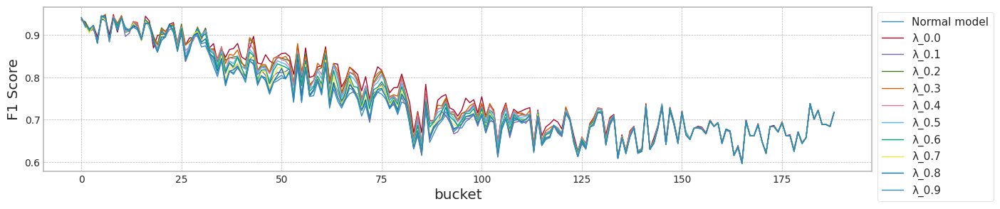

                   lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Case #4, Normal model  0.895028  0.940639  0.739167  0.717949  0.911171
1                     0.0  0.900000  0.935780  0.763698  0.717949  0.946302
2                     0.1  0.910112  0.935780  0.743869  0.717949  0.916942
3                     0.2  0.910112  0.935780  0.756976  0.717949  0.901201
4                     0.3  0.905028  0.935780  0.759707  0.717949  0.902255
5                     0.4  0.905028  0.940639  0.756060  0.717949  0.900628
6                     0.5  0.905028  0.940639  0.752983  0.717949  0.895838
7                     0.6  0.895028  0.940639  0.749621  0.717949  0.901998
8                     0.7  0.895028  0.940639  0.745182  0.717949  0.905154
9                     0.8  0.895028  0.940639  0.743319  0.717949  0.905106
10                    0.9  0.895028  0.940639  0.741663  0.717949  0.911981
max_mean_lambda= 0.0


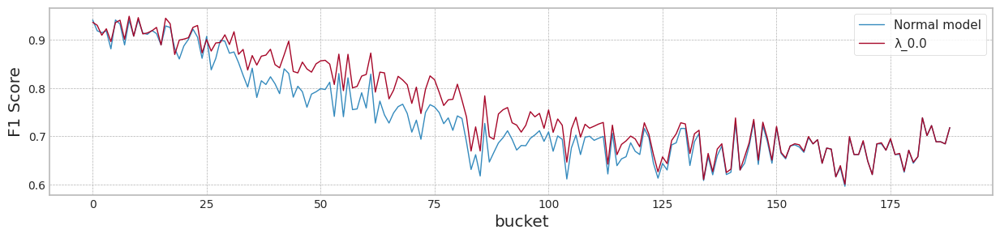

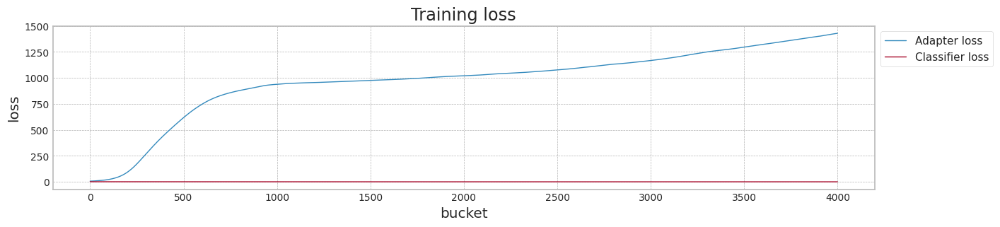

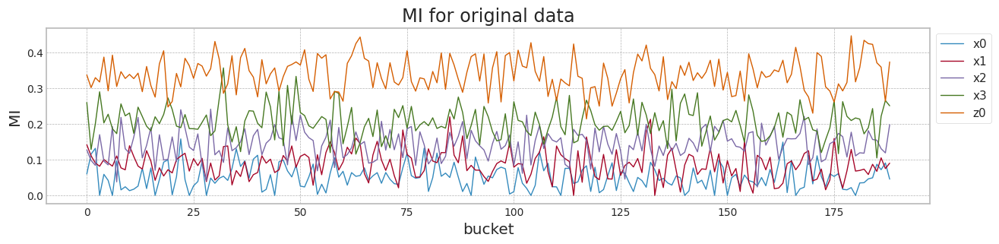

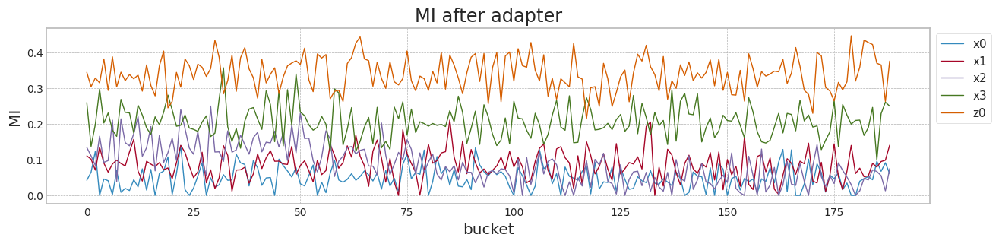

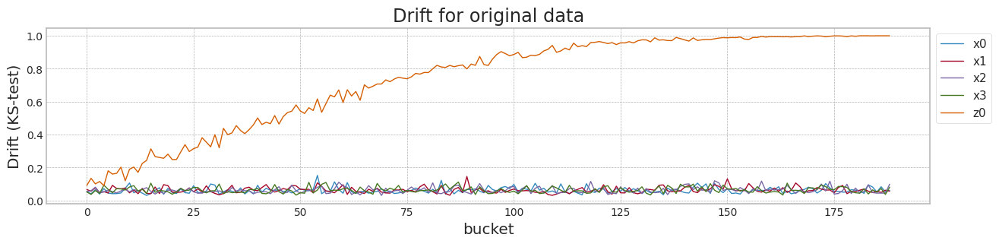

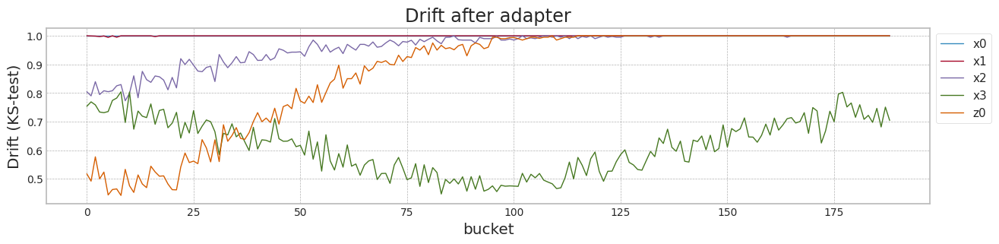

In [70]:
seed_everything()

train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X3[0:1800].values, dtype=torch.float32),
                          y_train = torch.tensor(y3[0:1800], dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X3[1800:2000].values, dtype=torch.float32),
                         y_test = torch.tensor(y3[1800:2000], dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [-0.1, 0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.4,0.5]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.



#lambda_f_set2 = [0.0000089,0.0000090,0.0000091]
lambda_f_set2 = [1.0]
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2

    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf  = test_all_data(last_generator,last_adapter,
                                           X3[0:1800][['x0','x1','x2','x3','z0']],
                                           X3[2000:],
                                           y3[2000:])

        if lambda_f < 0.0:
            result_table2['lambda'].append("Case #4, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)

    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df[1:]['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

## synthetic data의 생성 (Case #5 - Case #1,2,3,4의 상황이 각 feature에 혼재되어 있는 경우)

In [71]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.5 , 0.7, 2.5])

x4 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x4[:,ix] = np.random.normal(1,cor_,data_size)

y4_array = []
cor_const = cor[4]
cor_const2 = 3/x4.shape[0]
for ii in range(x4.shape[0]):
    # Case #2, MI의 증감(상대적), Drift의 고정 - z0
    cor[4] = cor[4] - cor_const / x4.shape[0]
    e = np.random.normal(0.0, 2.0)
    # Case #3 MI의 증감(상대적), Drift의 증가 - x3
    e1 = np.random.normal(0.0, 3*cor_const2 * ii)
    x4[ii,3] = x4[ii,3] + e1
    y4_array.append(np.sum(cor * x4[ii])+e)

y4 = [1 if y_ > 5 else 0 for y_ in y4_array]

for i in range(len(y4)):
    #Case #1 MI의 감소, Drift의 증가 - x2
    x4[i,2] = y4[i] + np.random.normal(1,0.5+(i/data_size))
    #Case #4 MI의 고정, Drift의 증가 - x1
    x4[i,1] = y4[i] + np.random.normal(0.0 + 4*(i/data_size),cor[1])


In [72]:
columns=['x0','x1','x2','x3','z0']
X4 = pd.DataFrame(x4,columns=columns)
mi_scores = make_mi_scores(X4, y4, discrete_features="auto")
print(mi_scores)

x3    0.145527
x2    0.113997
z0    0.092832
x0    0.043090
x1    0.024980
Name: MI Scores, dtype: float64


Bucket size 200 step_size 190


100%|██████████| 190/190 [00:02<00:00, 73.62it/s]


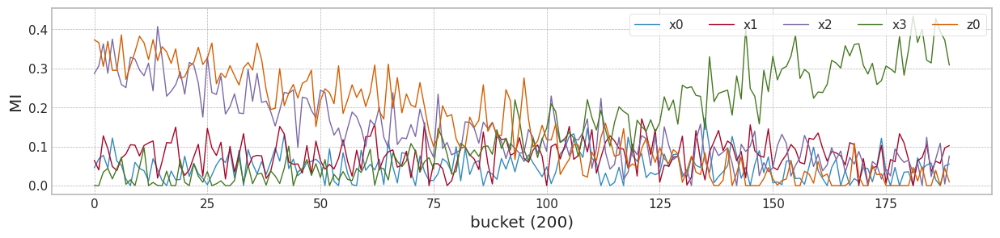

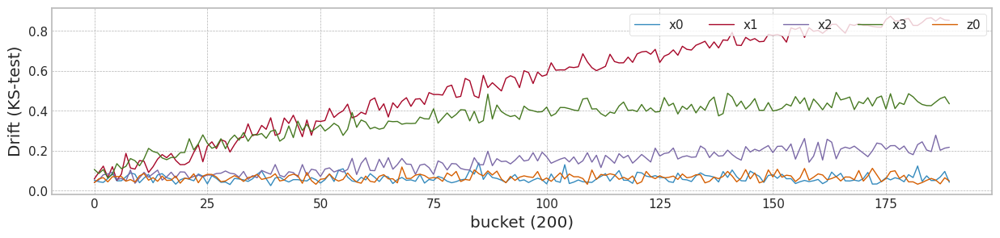

In [73]:
from tqdm import tqdm

bucket_size_array=[200]#[10,50,100,200]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler_c5 = StandardScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
scaler_c5.fit(X4[0:1800])
X4 = pd.DataFrame(scaler_c5.transform(X4), columns=columns)

for bucket_size in bucket_size_array:
    #bucket_size = 10

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((x4.shape[0]-2000)/bucket_size)
    print('Bucket size',bucket_size,'step_size',step_size)
    for bk in tqdm(range(step_size)):
        #print(bk,step_size)
        mi_scores = make_mi_scores(X4[bk*bucket_size:bk*bucket_size+bucket_size], y4[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X4[0:1800].values,X4[bk*bucket_size+2000:bk*bucket_size+bucket_size+2000].values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)
    plt.figure(figsize=main_figsize)
    plt.plot(df_mis[['x0','x1','x2','x3','z0']].values,linewidth=1,label=['x0','x1','x2','x3','z0'])
    #plt.plot(df_mis[['x2','x3','z0']].values,linewidth=3,label=['x2','x3','z0'])
    plt.ylabel('MI')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

    plt.figure(figsize=main_figsize)
    plt.plot(df_drf[['x0','x1','x2','x3','z0']].values,linewidth=1,label=['x0','x1','x2','x3','z0'])
    #plt.plot(df_drf[['x2','x3','z0']].values,linewidth=3,label=['x2','x3','z0'])
    plt.ylabel('Drift (KS-test)')
    plt.xlabel(f'bucket ({bucket_size})')
    #df_mis.plot(figsize=(20,5),linewidth=1,ylabel='MI',xlabel=f'bucket ({bucket_size})',fontsize=15)
    plt.legend(loc=1,ncol=5)
    plt.show()

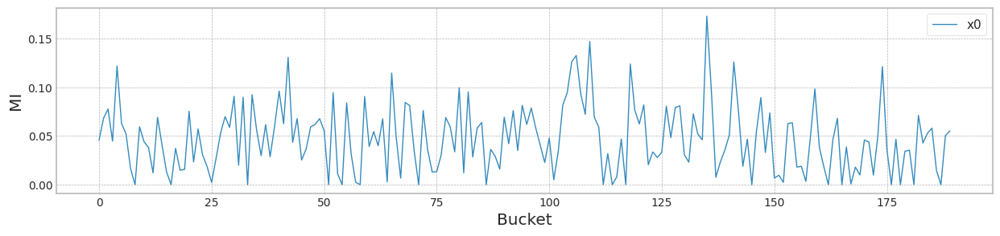

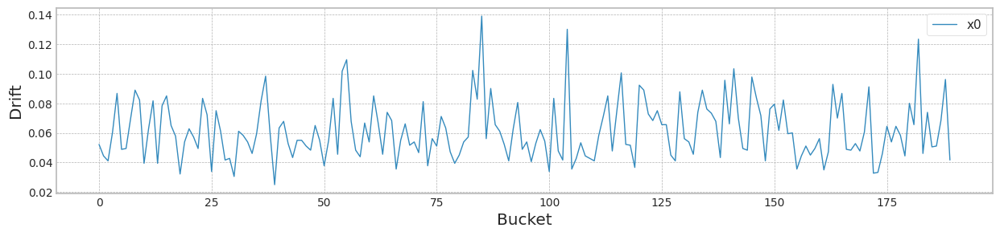

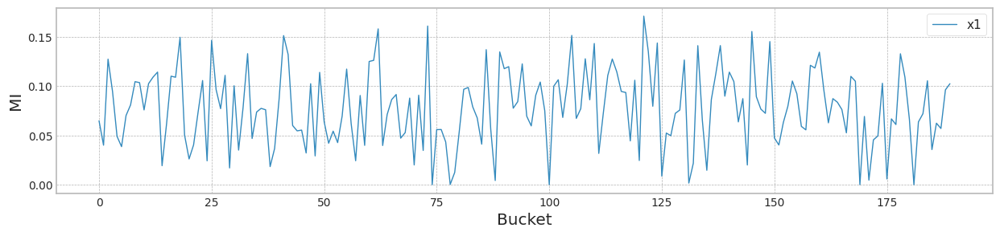

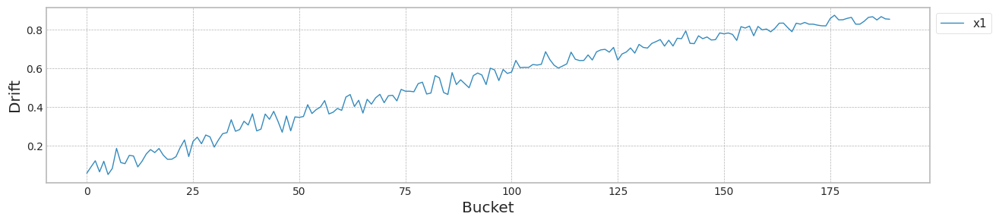

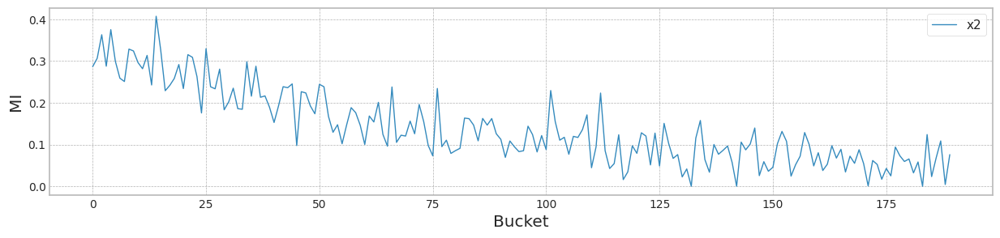

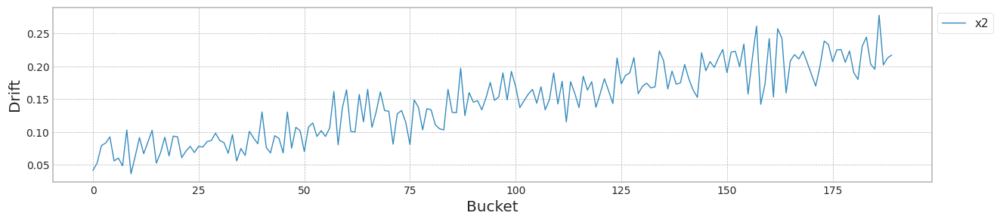

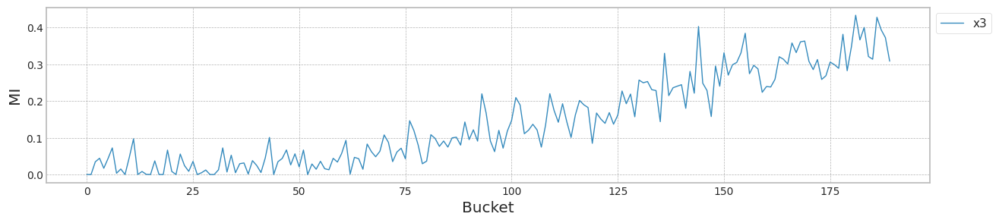

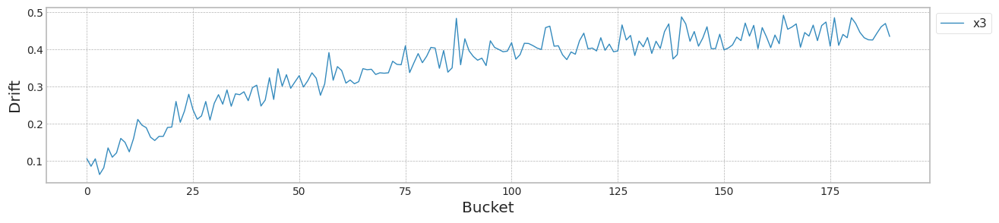

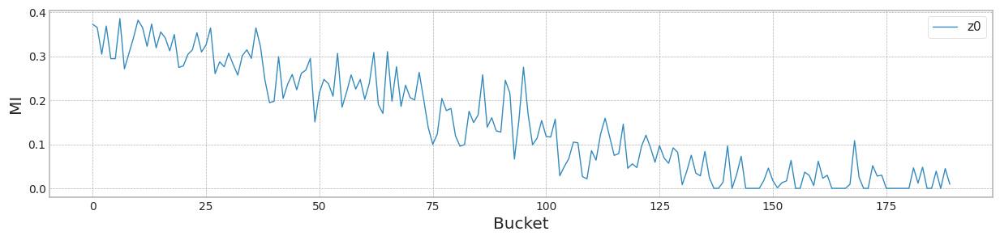

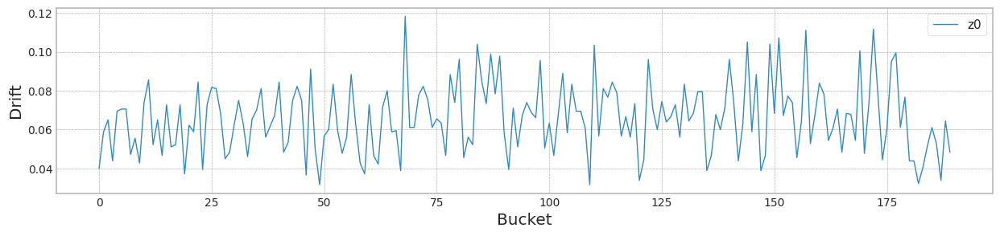

In [74]:
for cn in columns:
    df_mis[cn].plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='Bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()
    df_drf[cn].plot(figsize=main_figsize,linewidth=1,ylabel='Drift',xlabel='Bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

<table>
<tr>
<td>구분</td><td>x0</td><td>x1</td><td>x2</td><td>x3</td><td>z0</td>
</tr>
<tr>
<td>MI 증가</td><td>-</td><td>-</td><td>-</td><td>O</td><td>-</td>
</tr>
<tr>
<td>MI 감소</td><td>-</td><td>-</td><td>O</td><td>-</td><td>O</td>
</tr>
<tr>
<td>MI 고정</td><td>O</td><td>O</td><td>-</td><td>-</td><td>-</td>
</tr>

<tr>
<td>Drift 증가</td><td>-</td><td>O</td><td>O</td><td>O</td><td>-</td>
</tr>
<tr>
<td>Drift 감소</td><td>-</td><td>-</td><td>-</td><td>-</td><td>-</td>
</tr>
<tr>
<td>Drift 고정</td><td>O</td><td>-</td><td>-</td><td>-</td><td>O</td>
</tr>
</table>

### 내성학습의 적용!

In [75]:
X4['b'] = [int(b/100) for b in X4.index.values]
X4

,x0,x1,x2,x3,z0,b
0,0.557441,-0.817302,-1.425469,0.192742,-1.223276,0
1,1.187568,0.361915,-0.848668,0.402593,0.961059,0
2,0.788527,-0.740149,0.439556,1.384411,-0.336884,0
3,-0.791986,0.181836,1.717422,0.051917,0.585143,0
4,0.388948,0.638406,-1.440773,-0.378224,-0.333425,0
...,...,...,...,...,...,...
39995,-0.871702,1.547741,-2.000360,2.393277,1.303158,399
39996,-0.687055,4.730407,-1.954463,-3.314622,1.199950,399
39997,0.807827,4.017663,1.021360,15.497050,-0.206506,399
39998,-0.127522,4.603937,-0.581545,5.237343,1.691405,399


cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 0.702924]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.667881]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.614163]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.542907]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.468669]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.399116]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.339553]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.291403]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.251569]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.214823]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.190997]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.174331]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.162350]
[Lambda: -0.

100%|██████████| 189/189 [00:03<00:00, 62.34it/s]


mean of drift:
x0    0.061681
x1    0.532260
x2    0.145024
x3    0.354133
z0    0.065844
dtype: float64
Mean F1 for all data: 0.8300843520774839
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 6.529903] [G loss: 0.706720]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 109.454514] [G loss: 0.480700]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 593.087891] [G loss: 0.173031]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 977.979553] [G loss: 0.132339]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 1206.310547] [G loss: 0.125431]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 1322.634399] [G loss: 0.122141]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 1368.721313] [G loss: 0.119513]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 1390.622070] [G loss: 0.117727]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 1398.064453] [G loss: 0.116309]
[Lambda: 0.000000] [Epoch 1800/4000] [a loss: 1405.617554] [G loss: 0.115262]
[Lambda: 0.000000] [Epoch 2000/4000] [a loss: 1417.369751] [G loss: 0.114293]
[L

100%|██████████| 189/189 [00:03<00:00, 59.18it/s]


mean of drift:
x0    0.698698
x1    1.000000
x2    0.602246
x3    0.897093
z0    0.841229
dtype: float64
Mean F1 for all data: 0.5532498115787043
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 6.529903] [G loss: 0.706720]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 0.053551] [G loss: 0.653382]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.097042] [G loss: 0.577703]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.153740] [G loss: 0.487628]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.183138] [G loss: 0.404399]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.187190] [G loss: 0.325228]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.172515] [G loss: 0.265231]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.147317] [G loss: 0.225455]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.122780] [G loss: 0.198038]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.101233] [G loss: 0.178410]
[Lambda: 0.100000] [Epoch 2000/4000] [a loss: 0.084258] [G loss: 0.163971]
[Lambda: 0.100000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 61.02it/s]


mean of drift:
x0    0.496349
x1    0.548798
x2    0.664785
x3    0.372275
z0    0.503233
dtype: float64
Mean F1 for all data: 0.7315599117142964
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 6.529903] [G loss: 0.706720]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 0.025044] [G loss: 0.657883]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.021395] [G loss: 0.590425]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.033835] [G loss: 0.507662]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.042687] [G loss: 0.426935]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.046636] [G loss: 0.347432]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.045025] [G loss: 0.283129]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.039918] [G loss: 0.238933]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.033877] [G loss: 0.208040]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.027930] [G loss: 0.185991]
[Lambda: 0.200000] [Epoch 2000/4000] [a loss: 0.022980] [G loss: 0.169947]
[Lambda: 0.200000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 60.78it/s]


mean of drift:
x0    0.331023
x1    0.472951
x2    0.427090
x3    0.367975
z0    0.340726
dtype: float64
Mean F1 for all data: 0.7794264127766714
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 6.529903] [G loss: 0.706720]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 0.020047] [G loss: 0.659421]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.009113] [G loss: 0.594590]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.012406] [G loss: 0.515015]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.015776] [G loss: 0.435961]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.017391] [G loss: 0.357647]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.017319] [G loss: 0.291473]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.015522] [G loss: 0.245585]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.013392] [G loss: 0.213247]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.011096] [G loss: 0.190021]
[Lambda: 0.300000] [Epoch 2000/4000] [a loss: 0.009288] [G loss: 0.173041]
[Lambda: 0.300000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 59.39it/s]


mean of drift:
x0    0.264245
x1    0.461055
x2    0.366258
x3    0.365526
z0    0.289974
dtype: float64
Mean F1 for all data: 0.8197429663667484
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 6.529903] [G loss: 0.706720]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 0.018380] [G loss: 0.660219]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.005453] [G loss: 0.596589]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.005769] [G loss: 0.518736]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.006974] [G loss: 0.440812]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.007702] [G loss: 0.362500]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.007724] [G loss: 0.296037]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.007005] [G loss: 0.249351]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.006037] [G loss: 0.216302]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.005183] [G loss: 0.192440]
[Lambda: 0.400000] [Epoch 2000/4000] [a loss: 0.004285] [G loss: 0.175055]
[Lambda: 0.400000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 61.23it/s]


mean of drift:
x0    0.215661
x1    0.464544
x2    0.302440
x3    0.362801
z0    0.245215
dtype: float64
Mean F1 for all data: 0.846681195939042
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 6.529903] [G loss: 0.706720]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 0.017668] [G loss: 0.660711]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.003981] [G loss: 0.597813]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.003146] [G loss: 0.520955]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.003406] [G loss: 0.443781]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.003668] [G loss: 0.365460]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.003665] [G loss: 0.298940]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.003328] [G loss: 0.251868]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.002874] [G loss: 0.218351]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.002446] [G loss: 0.194174]
[Lambda: 0.500000] [Epoch 2000/4000] [a loss: 0.002077] [G loss: 0.176549]
[Lambda: 0.500000] [Epoch 2200

100%|██████████| 189/189 [00:03<00:00, 60.76it/s]


mean of drift:
x0    0.168436
x1    0.476855
x2    0.261749
x3    0.361143
z0    0.202063
dtype: float64
Mean F1 for all data: 0.8583929951759453
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 6.529903] [G loss: 0.706720]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 0.017317] [G loss: 0.661041]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.003272] [G loss: 0.598693]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.001977] [G loss: 0.522422]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.001801] [G loss: 0.445778]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.001823] [G loss: 0.367621]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.001783] [G loss: 0.301045]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.001603] [G loss: 0.253676]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.001376] [G loss: 0.219855]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.001168] [G loss: 0.195414]
[Lambda: 0.600000] [Epoch 2000/4000] [a loss: 0.000994] [G loss: 0.177617]
[Lambda: 0.600000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 58.20it/s]


mean of drift:
x0    0.131808
x1    0.486808
x2    0.226479
x3    0.360141
z0    0.155050
dtype: float64
Mean F1 for all data: 0.858815264020602
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 6.529903] [G loss: 0.706720]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 0.017126] [G loss: 0.661278]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.002908] [G loss: 0.599371]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.001412] [G loss: 0.523499]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.001048] [G loss: 0.447197]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.000934] [G loss: 0.369487]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.000871] [G loss: 0.302721]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.000765] [G loss: 0.255083]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.000653] [G loss: 0.220980]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.000555] [G loss: 0.196331]
[Lambda: 0.700000] [Epoch 2000/4000] [a loss: 0.000470] [G loss: 0.178402]
[Lambda: 0.700000] [Epoch 2200

100%|██████████| 189/189 [00:03<00:00, 59.58it/s]


mean of drift:
x0    0.110667
x1    0.497557
x2    0.195529
x3    0.359177
z0    0.131993
dtype: float64
Mean F1 for all data: 0.8541323887376329
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 6.529903] [G loss: 0.706720]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 0.017017] [G loss: 0.661455]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.002723] [G loss: 0.599904]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.001123] [G loss: 0.524387]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.000692] [G loss: 0.448272]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.000525] [G loss: 0.370750]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.000435] [G loss: 0.303946]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.000361] [G loss: 0.256150]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.000302] [G loss: 0.221865]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.000257] [G loss: 0.197064]
[Lambda: 0.800000] [Epoch 2000/4000] [a loss: 0.000220] [G loss: 0.179013]
[Lambda: 0.800000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 60.51it/s]


mean of drift:
x0    0.086740
x1    0.506628
x2    0.176534
x3    0.358301
z0    0.105450
dtype: float64
Mean F1 for all data: 0.8480491112960354
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 6.529903] [G loss: 0.706720]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 0.016952] [G loss: 0.661592]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.002636] [G loss: 0.600334]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.000986] [G loss: 0.525158]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000522] [G loss: 0.449235]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000345] [G loss: 0.371741]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.000251] [G loss: 0.304873]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.000194] [G loss: 0.256951]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.000156] [G loss: 0.222533]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.000130] [G loss: 0.197635]
[Lambda: 0.900000] [Epoch 2000/4000] [a loss: 0.000110] [G loss: 0.179507]
[Lambda: 0.900000] [Epoch 220

100%|██████████| 189/189 [00:03<00:00, 59.52it/s]


mean of drift:
x0    0.068742
x1    0.515785
x2    0.161964
x3    0.357419
z0    0.079368
dtype: float64
Mean F1 for all data: 0.8394637009273279


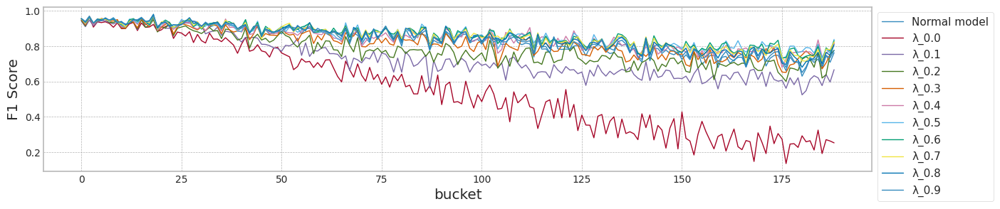

                   lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Case #5, Normal model  0.957627  0.955752  0.830084  0.762646  0.829258
1                     0.0  0.957627  0.945946  0.553250  0.252101  0.817074
2                     0.1  0.953191  0.941704  0.731560  0.666667  0.831847
3                     0.2  0.961702  0.946429  0.779426  0.776471  0.838855
4                     0.3  0.961702  0.951111  0.819743  0.819672  0.827645
5                     0.4  0.961702  0.955752  0.846681  0.814070  0.836031
6                     0.5  0.961702  0.955752  0.858393  0.838095  0.834617
7                     0.6  0.957627  0.955752  0.858815  0.830357  0.832262
8                     0.7  0.957627  0.955752  0.854132  0.824034  0.830874
9                     0.8  0.957627  0.955752  0.848049  0.808333  0.831597
10                    0.9  0.957627  0.955752  0.839464  0.776000  0.833866
max_mean_lambda= 0.6


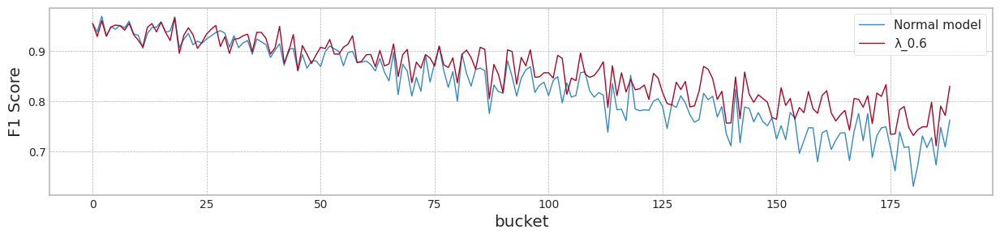

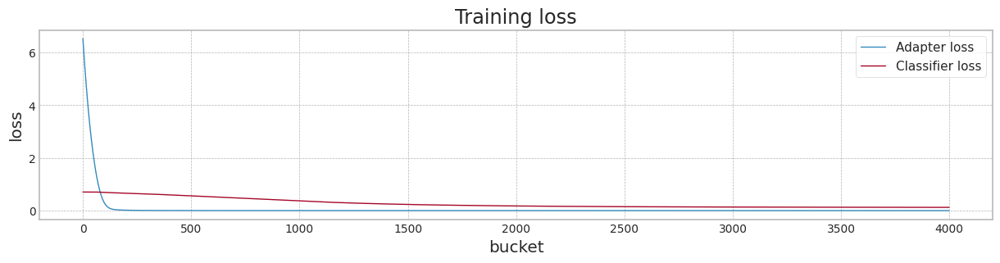

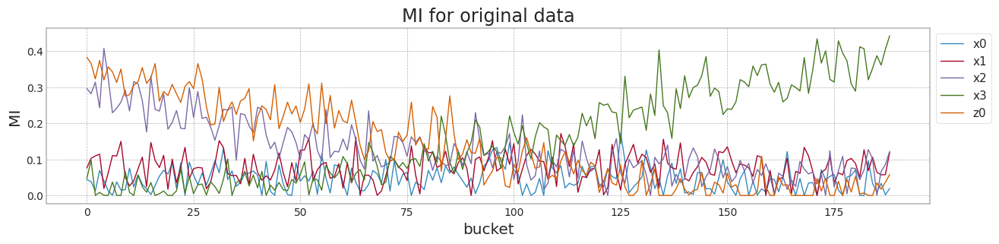

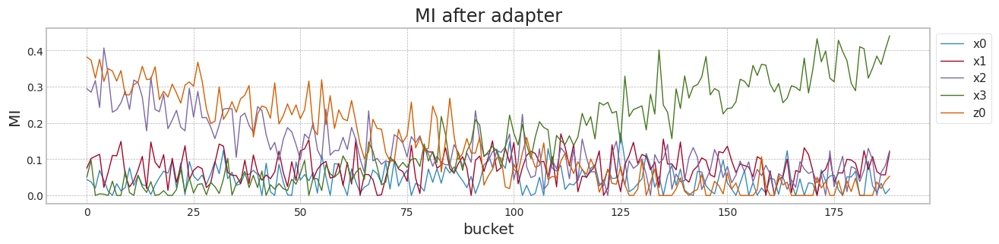

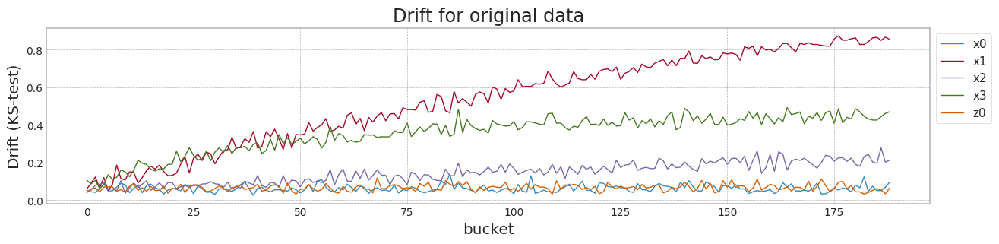

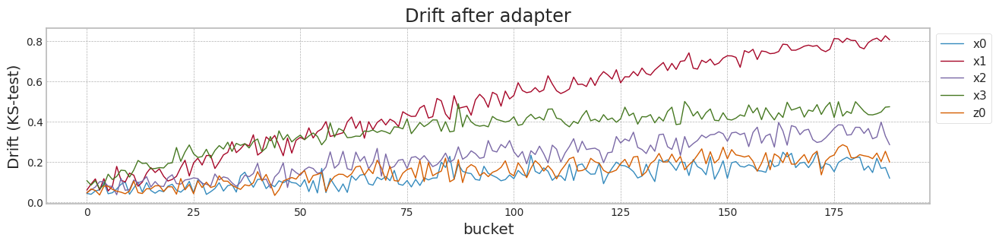

In [76]:
#train_result = []

avaible_range = 400

train_tensors = Namespace(XS_train = torch.tensor(X4[0:1800].values, dtype=torch.float32),
                          y_train = torch.tensor(y4[0:1800], dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X4[1800:2000].values, dtype=torch.float32),
                         y_test = torch.tensor(y4[1800:2000], dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
seed = 1

lambda_f_set = [-0.1, 0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
#lambda_f_set = [0.4,0.5]
#lambda_r = 0.4 # Lambda value for the robustness discriminator of FR-Train.



#lambda_f_set2 = [0.0000089,0.0000090,0.0000091]
lambda_f_set2 = [1.0]
lambda_a2 = 0.0

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2

    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:
        '''
        if lambda_f == 0.0:
            f1,mi,last_generator= train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed)
            result_table[f'lambda_{lambda_f}'] = test_all_data(last_generator)
        else:
        '''
        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf  = test_all_data(last_generator,last_adapter,
                                           X4[0:1800][['x0','x1','x2','x3','z0']],
                                           X4[2000:][['x0','x1','x2','x3','z0','b']],
                                           y4[2000:])

        if lambda_f < 0.0:
            result_table2['lambda'].append("Case #5, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)

    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df[1:]['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()


## real-world data(Loan data)의 실험

In [77]:

if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


### Data load

In [78]:

df_accepted = pd.read_csv("/content/drive/MyDrive/Drift/accepted_2007_to_2018Q4.csv")

print(df_accepted.shape)

(2260701, 151)


### Data 정제

In [79]:
# for the sake of simplicity, let's consider only Fully Paid and Charged Off values:
df_accepted = df_accepted[df_accepted.loan_status.isin(['Fully Paid', 'Charged Off'])]
print(df_accepted.shape)

cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(50).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# maybe we can go further, and eliminate columns up to title:
cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(45).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# Remaining columns have missing data points, but they account for less than 0.2% of the total data. Let's remove the rows that are missing those values in those columns with dropna():
df_accepted = df_accepted.dropna()
print(df_accepted.shape)

# These are constant columns. We can drop it either.
cols_to_drop = ['out_prncp', 'out_prncp_inv', 'policy_code']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# It seems we have many "duplicated" information. Let's drop some columns, based on visual inspection at corr_pairs dataframe:
cols_to_drop = ['fico_range_low', 'funded_amnt_inv', 'funded_amnt', 'total_pymnt_inv', 'total_pymnt', 'installment', 'collection_recovery_fee', 'total_rec_prncp', 'last_fico_range_low']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

values = df_accepted.loan_status.unique()
encode = [1,0]
d = dict(zip(values, encode))
df_accepted['loan_paid'] = df_accepted['loan_status'].map(d)
df_accepted = df_accepted.drop(columns=['loan_status'])

df_accepted

(1345310, 151)
(1345310, 101)
(1345310, 56)
(1341026, 56)
(1341026, 53)
(1341026, 44)


,id,loan_amnt,term,int_rate,grade,sub_grade,home_ownership,annual_inc,verification_status,issue_d,...,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,hardship_flag,disbursement_method,debt_settlement_flag,loan_paid
0,68407277,3600.0,36 months,13.99,C,C4,MORTGAGE,55000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
1,68355089,24700.0,36 months,11.99,C,C1,MORTGAGE,65000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2,68341763,20000.0,60 months,10.78,B,B4,MORTGAGE,63000.0,Not Verified,Dec-2015,...,Joint App,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
4,68476807,10400.0,60 months,22.45,F,F1,MORTGAGE,104433.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
5,68426831,11950.0,36 months,13.44,C,C3,RENT,34000.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260688,89905081,18000.0,60 months,9.49,B,B2,OWN,130000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260690,88948836,29400.0,60 months,13.99,C,C3,MORTGAGE,180792.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260691,89996426,32000.0,60 months,14.49,C,C4,MORTGAGE,157000.0,Source Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,0
2260692,90006534,16000.0,60 months,12.79,C,C1,RENT,150000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,3.0,0.0,N,Cash,N,1


In [80]:
# droping constant columns
print(df_accepted.pymnt_plan.value_counts())
print(df_accepted.hardship_flag.value_counts())
cols_to_drop = ['id', 'pymnt_plan', 'hardship_flag']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)
cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

print(df_accepted.term.value_counts())

# convert term into either a 36 or 60 integer numeric data type

l1 = df_accepted.term.unique()
l2 = [36, 60]
d = dict(zip(l1, l2))

df_accepted['term'] = df_accepted['term'].map(d)

# as grade is part of sub_grade, so let's just drop the grade feature.

df_accepted = df_accepted.drop(columns='grade')

df_accepted = pd.get_dummies(df_accepted, columns = ['sub_grade'], prefix='', prefix_sep='', drop_first=True)

cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

# for these columns, let's just create dummy variables, concatenate them with the original dataframe and drop original columns.

df_accepted = pd.get_dummies(df_accepted, columns = ['verification_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['application_type'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['initial_list_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['purpose'], prefix='', prefix_sep='', drop_first=True)
print(df_accepted.shape)

df_accepted['home_ownership'] = df_accepted.home_ownership.replace('NONE', 'ANY')
df_accepted = pd.get_dummies(df_accepted, columns = ['home_ownership'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=[ 'url', 'last_pymnt_d', 'last_credit_pull_d'])
df_accepted = df_accepted.drop(columns=['zip_code', 'addr_state'])
df_accepted = pd.get_dummies(df_accepted, columns = ['disbursement_method'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['debt_settlement_flag'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=['earliest_cr_line'])
print(df_accepted.shape)


df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jan','01')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Feb','02')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Mar','03')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Apr','04')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('May','05')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jun','06')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jul','07')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Aug','08')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Sep','09')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Oct','10')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Dec','11')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Nov','12')

def reorder_issue_d(dt):
    a = dt.split('-')
    return a[1]+a[0]

reorder_issue_d('01-2009')

df_accepted['issue_d'] = df_accepted['issue_d'].apply(reorder_issue_d)
df_accepted = df_accepted.sort_values(by='issue_d')
df_accepted.reset_index(drop=True, inplace=True)

df_accepted.info()

n    1341026
Name: pymnt_plan, dtype: int64
N    1341026
Name: hardship_flag, dtype: int64
(1341026, 41)
Index(['term', 'grade', 'sub_grade', 'home_ownership', 'verification_status',
       'issue_d', 'url', 'purpose', 'zip_code', 'addr_state',
       'earliest_cr_line', 'initial_list_status', 'last_pymnt_d',
       'last_credit_pull_d', 'application_type', 'disbursement_method',
       'debt_settlement_flag'],
      dtype='object')
 36 months    1017398
 60 months     323628
Name: term, dtype: int64
Index(['home_ownership', 'verification_status', 'issue_d', 'url', 'purpose',
       'zip_code', 'addr_state', 'earliest_cr_line', 'initial_list_status',
       'last_pymnt_d', 'last_credit_pull_d', 'application_type',
       'disbursement_method', 'debt_settlement_flag'],
      dtype='object')
(1341026, 86)
(1341026, 83)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1341026 entries, 0 to 1341025
Data columns (total 83 columns):
 #   Column                      Non-Null Count    Dtype  

### Dataset 만들기

In [81]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values

2010
2011
2012
2013
2014
2015
2016
2017
2018


In [82]:

X[2010].shape

(11497, 81)

In [83]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'dti', 'delinq_2yrs',
       'fico_range_high', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'total_rec_int', 'total_rec_late_fee',
       'recoveries', 'last_pymnt_amnt', 'last_fico_range_high',
       'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],
      dtype

### Data의 MI, Drift 특성 파악
+ MI Top 5에 대하여 MI의 변화
+ MI Top 5에 대하여 Drift의 변화

In [84]:
X_df = pd.DataFrame(X[2010],columns=COLUMNS)
mi_scores = make_mi_scores(X_df, Y[2010], discrete_features="auto")
print(mi_scores)

recoveries              0.375531
last_fico_range_high    0.094419
last_pymnt_amnt         0.086202
total_rec_late_fee      0.032419
int_rate                0.020560
                          ...   
delinq_amnt             0.000000
C3                      0.000000
Source Verified         0.000000
Verified                0.000000
D3                      0.000000
Name: MI Scores, Length: 81, dtype: float64


In [85]:
# MI Top 5, columns
top_columns = list(mi_scores[0:5].index)
top_columns

['recoveries',
 'last_fico_range_high',
 'last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate']

+ 일부러 예측 확률을 떨어뜨리기 위해 (조정), "recoveries" feature를 제외 한다.

In [86]:
top_columns = list(mi_scores[2:7].index)
top_columns

['last_pymnt_amnt', 'total_rec_late_fee', 'int_rate', 'term', 'Y']

In [87]:
top_columns_index = [list(COLUMNS).index(tc) for tc in top_columns]
top_columns_index

[16, 14, 2, 1, 80]

In [88]:
# 2010년의 data를 기준으로 그 이후의 data 들...
X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
X2 = pd.DataFrame(X2,columns = COLUMNS)[top_columns]
#X2_df_t5 = X2_df[top_columns]

Bucket size 10000 step_size 126


100%|██████████| 126/126 [00:24<00:00,  5.17it/s]


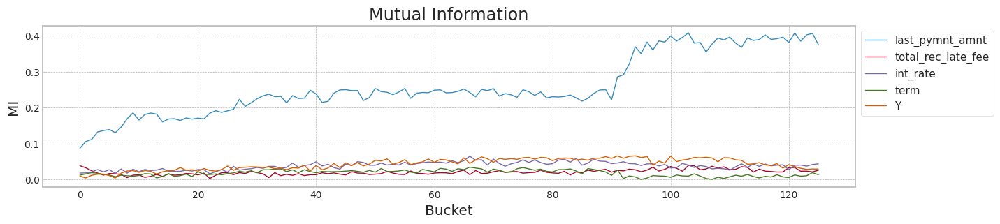

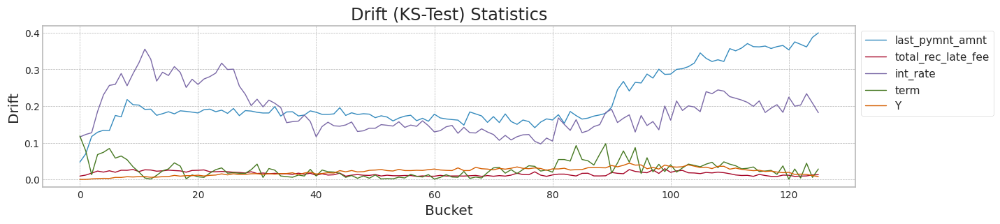

In [89]:
from tqdm import tqdm

bucket_size_array=[10000]

######################## Normalization ############################
from sklearn.preprocessing import MinMaxScaler, StandardScaler
scaler_c1 = StandardScaler()
# trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
scaler_c1.fit(X2[0:10000])  #11497
X2 = pd.DataFrame(scaler_c1.transform(X2[top_columns]), columns=top_columns)

for bucket_size in bucket_size_array:

    MIS = {}
    DRF = {}
    for col in top_columns:
        MIS[col] = []
        DRF[col] = []

    #step_size = int(x.shape[0]/bucket_size)
    step_size = int((X2.shape[0]-10000)/bucket_size)
    print('Bucket size',bucket_size,'step_size',step_size)

    for bk in tqdm(range(step_size)):
        #print(bk,step_size)
        '''
        mi_scores = make_mi_scores(X2_df_t5[bk*bucket_size:bk*bucket_size+bucket_size],
                                   Y2[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X_df[top_columns].values,X2_df_t5[bk*bucket_size+tl:bk*bucket_size+bucket_size+tl].values)
        '''
        mi_scores = make_mi_scores(X2[bk*bucket_size:bk*bucket_size+bucket_size], Y2[bk*bucket_size:bk*bucket_size+bucket_size], discrete_features="auto")
        ks = __ks_drift(X2[0:10000].values,X2[bk*bucket_size+10000:bk*bucket_size+bucket_size+10000].values)
        for ix,col in enumerate(top_columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)
    df_mis.plot(figsize=main_figsize,linewidth=1,title='Mutual Information',ylabel='MI',xlabel='Bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    df_drf.plot(figsize=main_figsize,linewidth=1,title='Drift (KS-Test) Statistics',ylabel='Drift',xlabel='Bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

### Loan data의 학습

cuda:0


100%|██████████| 100/100 [00:01<00:00, 62.09it/s]


F1: 0.94


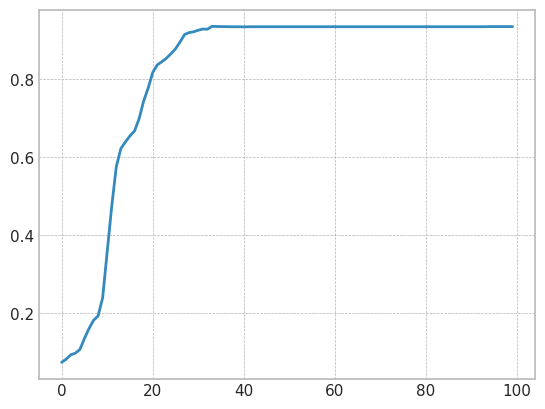

feature 5, test_f1 0.9355300859598853


In [90]:
import copy
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score

seed_everything()

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

X_train = torch.tensor(X2[0:10000].values, dtype=torch.float32).to(device)
y_train = torch.tensor(Y2[0:10000], dtype=torch.float32).reshape(-1, 1).to(device)

X_test = torch.tensor(X2[10000:11497].values, dtype=torch.float32).to(device)
y_test = torch.tensor(Y2[10000:11497], dtype=torch.float32).reshape(-1, 1).to(device)

# Define the model
loan_model = Generator().to(device)


# loss function and optimizer
loss_fn = nn.BCELoss()  # mean square error
optimizer = optim.Adam(loan_model.parameters(), lr=0.0001)

n_epochs = 100   # number of epochs to run
batch_size = 1000  # size of each batch
batch_start = torch.arange(0, len(X_train), batch_size)

# Hold the best model
best_mse = -np.inf   # init to infinity
best_weights = None
history = []

for epoch in tqdm(range(n_epochs)):
    loan_model.train()
    with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
        bar.set_description(f"Epoch {epoch}")
        for start in bar:
            # take a batch
            X_batch = X_train[start:start+batch_size]
            y_batch = y_train[start:start+batch_size]
            # forward pass
            y_pred = loan_model(X_batch)
            loss = loss_fn(y_pred, y_batch)
            # backward pass
            optimizer.zero_grad()
            loss.backward()
            # update weights
            optimizer.step()
            # print progress
            bar.set_postfix(mse=float(loss))
    # evaluate accuracy at end of each epoch
    loan_model.eval()
    y_pred = loan_model(X_test)
    y_pred = (y_pred.cpu().data.numpy()> 0.5).astype(float)
    f1 = f1_score(y_pred, y_test.cpu().data.numpy())
    f1 = float(f1)
    history.append(f1)
    if f1 > best_mse:
        best_mse = f1
        best_weights = copy.deepcopy(loan_model.state_dict())

# restore model and return best accuracy
loan_model.load_state_dict(best_weights)
print("F1: %.2f" % best_mse)
plt.plot(history)
plt.show()

predicted_y = loan_model(X_test)
f1 = f1_score(y_test.cpu().data.numpy(),(predicted_y.cpu().data.numpy()> 0.5).astype(float))
print('feature 5, test_f1',f1)

100%|██████████| 125/125 [00:00<00:00, 193.51it/s]


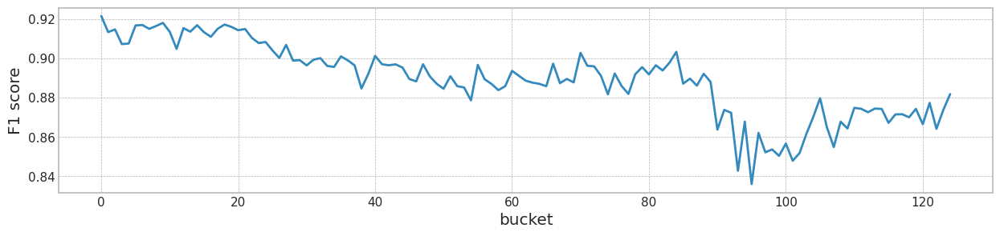

,lambda,test_f1,init_f1,mean_f1,last_f1,"MI(y^,z)"
0,"Loan data, Feature 5",0.93553,0.921454,0.889051,0.881781,0.0


In [91]:
bucket_size_array=[10000]
X3 = X2[11497:]
Y3 = Y2[11497:]

for bucket_size in bucket_size_array:
    bucket_count = int(X3.shape[0]/bucket_size)-1
    f1s = []
    for bk in tqdm(range(bucket_count)):
        tmp_x = torch.tensor(X3[bk*bucket_size:bk*bucket_size+bucket_size].values, dtype=torch.float32).to(device)
        predicted_y = loan_model(tmp_x)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y3[bk*bucket_size:bk*bucket_size+bucket_size],predicted_y)
        f1s.append(f1_)

    plt.figure(figsize=main_figsize)
    plt.plot(f1s)
    plt.ylabel('F1 score')
    plt.xlabel('bucket')
    #plt.title('Changes of F1 score according to bucket')
    plt.show()

result_table3 = {}
result_table3['lambda']=[]
result_table3['test_f1']=[]
result_table3['init_f1']=[]
result_table3['mean_f1']=[]
result_table3['last_f1']=[]
result_table3['MI(y^,z)']=[]

result_table3['lambda'].append('Loan data, Feature 5')
result_table3['test_f1'].append(f1)
result_table3['init_f1'].append(f1s[0])
result_table3['mean_f1'].append(np.mean(f1s))
result_table3['last_f1'].append(f1s[-1])
result_table3['MI(y^,z)'].append(0.0)

pd.DataFrame(result_table3)

### Concept-drift tolerant model 적용.

+ 1000개씩 한 bucket으로 만든다.

In [92]:
X2['b'] = [int(b/1000) for b in X2.index.values]

In [93]:
X2

,last_pymnt_amnt,total_rec_late_fee,int_rate,term,Y,b
0,-0.397694,-0.192655,0.496776,-0.584125,-0.063372,0
1,-0.554102,-0.192655,0.082156,-0.584125,-0.063372,0
2,2.028986,-0.192655,0.806996,-0.584125,-0.063372,0
3,-0.475459,-0.192655,1.221617,-0.584125,-0.063372,0
4,-0.435187,-0.192655,-0.022245,-0.584125,-0.063372,0
...,...,...,...,...,...,...
1279675,-0.624948,1.786667,-0.588993,-0.584125,-0.063372,1279
1279676,2.186015,-0.192655,-0.588993,-0.584125,-0.063372,1279
1279677,1.704188,-0.192655,-1.173638,-0.584125,-0.063372,1279
1279678,6.143207,-0.192655,-1.964102,-0.584125,-0.063372,1279


lambda_f2 1.0
cuda:0
[Lambda: -0.100000] [Epoch 0/4000] [a loss: 0.000000] [G loss: 0.738207]
[Lambda: -0.100000] [Epoch 200/4000] [a loss: 0.000000] [G loss: 0.681013]
[Lambda: -0.100000] [Epoch 400/4000] [a loss: 0.000000] [G loss: 0.611643]
[Lambda: -0.100000] [Epoch 600/4000] [a loss: 0.000000] [G loss: 0.535930]
[Lambda: -0.100000] [Epoch 800/4000] [a loss: 0.000000] [G loss: 0.469985]
[Lambda: -0.100000] [Epoch 1000/4000] [a loss: 0.000000] [G loss: 0.417043]
[Lambda: -0.100000] [Epoch 1200/4000] [a loss: 0.000000] [G loss: 0.377829]
[Lambda: -0.100000] [Epoch 1400/4000] [a loss: 0.000000] [G loss: 0.350627]
[Lambda: -0.100000] [Epoch 1600/4000] [a loss: 0.000000] [G loss: 0.332536]
[Lambda: -0.100000] [Epoch 1800/4000] [a loss: 0.000000] [G loss: 0.320676]
[Lambda: -0.100000] [Epoch 2000/4000] [a loss: 0.000000] [G loss: 0.312638]
[Lambda: -0.100000] [Epoch 2200/4000] [a loss: 0.000000] [G loss: 0.306907]
[Lambda: -0.100000] [Epoch 2400/4000] [a loss: 0.000000] [G loss: 0.302591

100%|██████████| 125/125 [00:25<00:00,  4.95it/s]


mean of drift:
last_pymnt_amnt       0.213426
total_rec_late_fee    0.955045
int_rate              0.188050
term                  0.745600
Y                     0.973994
dtype: float64
Mean F1 for all data: 0.9038321338358065
cuda:0
[Lambda: 0.000000] [Epoch 0/4000] [a loss: 6.274969] [G loss: 0.742156]
[Lambda: 0.000000] [Epoch 200/4000] [a loss: 74.028336] [G loss: 0.427064]
[Lambda: 0.000000] [Epoch 400/4000] [a loss: 217.196259] [G loss: 0.315554]
[Lambda: 0.000000] [Epoch 600/4000] [a loss: 390.418243] [G loss: 0.283689]
[Lambda: 0.000000] [Epoch 800/4000] [a loss: 542.273132] [G loss: 0.274876]
[Lambda: 0.000000] [Epoch 1000/4000] [a loss: 651.467712] [G loss: 0.272561]
[Lambda: 0.000000] [Epoch 1200/4000] [a loss: 732.816223] [G loss: 0.271463]
[Lambda: 0.000000] [Epoch 1400/4000] [a loss: 800.061707] [G loss: 0.270718]
[Lambda: 0.000000] [Epoch 1600/4000] [a loss: 861.718994] [G loss: 0.270153]
[Lambda: 0.000000] [Epoch 1800/4000] [a loss: 918.514648] [G loss: 0.269664]
[Lambda

100%|██████████| 125/125 [00:24<00:00,  5.11it/s]


mean of drift:
last_pymnt_amnt       0.811780
total_rec_late_fee    0.962900
int_rate              0.976390
term                  1.000000
Y                     0.973994
dtype: float64
Mean F1 for all data: 0.9007280452856207
cuda:0
[Lambda: 0.100000] [Epoch 0/4000] [a loss: 6.274969] [G loss: 0.742156]
[Lambda: 0.100000] [Epoch 200/4000] [a loss: 0.040430] [G loss: 0.664638]
[Lambda: 0.100000] [Epoch 400/4000] [a loss: 0.100987] [G loss: 0.575315]
[Lambda: 0.100000] [Epoch 600/4000] [a loss: 0.166628] [G loss: 0.483822]
[Lambda: 0.100000] [Epoch 800/4000] [a loss: 0.188103] [G loss: 0.414771]
[Lambda: 0.100000] [Epoch 1000/4000] [a loss: 0.166427] [G loss: 0.371239]
[Lambda: 0.100000] [Epoch 1200/4000] [a loss: 0.131969] [G loss: 0.344631]
[Lambda: 0.100000] [Epoch 1400/4000] [a loss: 0.102499] [G loss: 0.327567]
[Lambda: 0.100000] [Epoch 1600/4000] [a loss: 0.081938] [G loss: 0.315722]
[Lambda: 0.100000] [Epoch 1800/4000] [a loss: 0.067335] [G loss: 0.307250]
[Lambda: 0.100000] [Epoc

100%|██████████| 125/125 [00:24<00:00,  5.11it/s]


mean of drift:
last_pymnt_amnt       0.384387
total_rec_late_fee    0.945374
int_rate              0.567154
term                  0.743277
Y                     0.992420
dtype: float64
Mean F1 for all data: 0.8347927734318148
cuda:0
[Lambda: 0.200000] [Epoch 0/4000] [a loss: 6.274969] [G loss: 0.742156]
[Lambda: 0.200000] [Epoch 200/4000] [a loss: 0.008604] [G loss: 0.669919]
[Lambda: 0.200000] [Epoch 400/4000] [a loss: 0.018793] [G loss: 0.589231]
[Lambda: 0.200000] [Epoch 600/4000] [a loss: 0.031754] [G loss: 0.506305]
[Lambda: 0.200000] [Epoch 800/4000] [a loss: 0.039311] [G loss: 0.438013]
[Lambda: 0.200000] [Epoch 1000/4000] [a loss: 0.038105] [G loss: 0.389052]
[Lambda: 0.200000] [Epoch 1200/4000] [a loss: 0.031591] [G loss: 0.356667]
[Lambda: 0.200000] [Epoch 1400/4000] [a loss: 0.024325] [G loss: 0.335829]
[Lambda: 0.200000] [Epoch 1600/4000] [a loss: 0.018629] [G loss: 0.322095]
[Lambda: 0.200000] [Epoch 1800/4000] [a loss: 0.014828] [G loss: 0.312694]
[Lambda: 0.200000] [Epoc

100%|██████████| 125/125 [00:24<00:00,  5.07it/s]


mean of drift:
last_pymnt_amnt       0.412141
total_rec_late_fee    0.943938
int_rate              0.380189
term                  0.743818
Y                     0.993208
dtype: float64
Mean F1 for all data: 0.8193638893383213
cuda:0
[Lambda: 0.300000] [Epoch 0/4000] [a loss: 6.274969] [G loss: 0.742156]
[Lambda: 0.300000] [Epoch 200/4000] [a loss: 0.003544] [G loss: 0.671615]
[Lambda: 0.300000] [Epoch 400/4000] [a loss: 0.006423] [G loss: 0.593493]
[Lambda: 0.300000] [Epoch 600/4000] [a loss: 0.010611] [G loss: 0.513460]
[Lambda: 0.300000] [Epoch 800/4000] [a loss: 0.013210] [G loss: 0.446479]
[Lambda: 0.300000] [Epoch 1000/4000] [a loss: 0.013106] [G loss: 0.396533]
[Lambda: 0.300000] [Epoch 1200/4000] [a loss: 0.011090] [G loss: 0.362272]
[Lambda: 0.300000] [Epoch 1400/4000] [a loss: 0.008605] [G loss: 0.339774]
[Lambda: 0.300000] [Epoch 1600/4000] [a loss: 0.006498] [G loss: 0.325077]
[Lambda: 0.300000] [Epoch 1800/4000] [a loss: 0.005134] [G loss: 0.315159]
[Lambda: 0.300000] [Epoc

100%|██████████| 125/125 [00:24<00:00,  5.08it/s]


mean of drift:
last_pymnt_amnt       0.377956
total_rec_late_fee    0.945383
int_rate              0.294966
term                  0.743697
Y                     0.995598
dtype: float64
Mean F1 for all data: 0.8556885253026159
cuda:0
[Lambda: 0.400000] [Epoch 0/4000] [a loss: 6.274969] [G loss: 0.742156]
[Lambda: 0.400000] [Epoch 200/4000] [a loss: 0.002022] [G loss: 0.672468]
[Lambda: 0.400000] [Epoch 400/4000] [a loss: 0.002770] [G loss: 0.595584]
[Lambda: 0.400000] [Epoch 600/4000] [a loss: 0.004411] [G loss: 0.516943]
[Lambda: 0.400000] [Epoch 800/4000] [a loss: 0.005493] [G loss: 0.450611]
[Lambda: 0.400000] [Epoch 1000/4000] [a loss: 0.005486] [G loss: 0.400316]
[Lambda: 0.400000] [Epoch 1200/4000] [a loss: 0.004681] [G loss: 0.365180]
[Lambda: 0.400000] [Epoch 1400/4000] [a loss: 0.003622] [G loss: 0.341869]
[Lambda: 0.400000] [Epoch 1600/4000] [a loss: 0.002739] [G loss: 0.326615]
[Lambda: 0.400000] [Epoch 1800/4000] [a loss: 0.002126] [G loss: 0.316446]
[Lambda: 0.400000] [Epoc

100%|██████████| 125/125 [00:24<00:00,  5.10it/s]


mean of drift:
last_pymnt_amnt       0.349012
total_rec_late_fee    0.943848
int_rate              0.260808
term                  0.743882
Y                     0.996000
dtype: float64
Mean F1 for all data: 0.88610594259601
cuda:0
[Lambda: 0.500000] [Epoch 0/4000] [a loss: 6.274969] [G loss: 0.742156]
[Lambda: 0.500000] [Epoch 200/4000] [a loss: 0.001440] [G loss: 0.672967]
[Lambda: 0.500000] [Epoch 400/4000] [a loss: 0.001350] [G loss: 0.596820]
[Lambda: 0.500000] [Epoch 600/4000] [a loss: 0.002003] [G loss: 0.519021]
[Lambda: 0.500000] [Epoch 800/4000] [a loss: 0.002466] [G loss: 0.453107]
[Lambda: 0.500000] [Epoch 1000/4000] [a loss: 0.002469] [G loss: 0.402629]
[Lambda: 0.500000] [Epoch 1200/4000] [a loss: 0.002107] [G loss: 0.366993]
[Lambda: 0.500000] [Epoch 1400/4000] [a loss: 0.001638] [G loss: 0.343159]
[Lambda: 0.500000] [Epoch 1600/4000] [a loss: 0.001229] [G loss: 0.327524]
[Lambda: 0.500000] [Epoch 1800/4000] [a loss: 0.000951] [G loss: 0.317145]
[Lambda: 0.500000] [Epoch 

100%|██████████| 125/125 [00:24<00:00,  5.05it/s]


mean of drift:
last_pymnt_amnt       0.306230
total_rec_late_fee    0.942319
int_rate              0.239298
term                  0.742854
Y                     0.996000
dtype: float64
Mean F1 for all data: 0.9091490995059155
cuda:0
[Lambda: 0.600000] [Epoch 0/4000] [a loss: 6.274969] [G loss: 0.742156]
[Lambda: 0.600000] [Epoch 200/4000] [a loss: 0.001184] [G loss: 0.673298]
[Lambda: 0.600000] [Epoch 400/4000] [a loss: 0.000725] [G loss: 0.597635]
[Lambda: 0.600000] [Epoch 600/4000] [a loss: 0.000931] [G loss: 0.520425]
[Lambda: 0.600000] [Epoch 800/4000] [a loss: 0.001117] [G loss: 0.454768]
[Lambda: 0.600000] [Epoch 1000/4000] [a loss: 0.001111] [G loss: 0.404150]
[Lambda: 0.600000] [Epoch 1200/4000] [a loss: 0.000951] [G loss: 0.368131]
[Lambda: 0.600000] [Epoch 1400/4000] [a loss: 0.000741] [G loss: 0.343856]
[Lambda: 0.600000] [Epoch 1600/4000] [a loss: 0.000549] [G loss: 0.328044]
[Lambda: 0.600000] [Epoch 1800/4000] [a loss: 0.000424] [G loss: 0.317585]
[Lambda: 0.600000] [Epoc

100%|██████████| 125/125 [00:25<00:00,  4.98it/s]


mean of drift:
last_pymnt_amnt       0.248863
total_rec_late_fee    0.942229
int_rate              0.217091
term                  0.744268
Y                     0.996000
dtype: float64
Mean F1 for all data: 0.9155293898297342
cuda:0
[Lambda: 0.700000] [Epoch 0/4000] [a loss: 6.274969] [G loss: 0.742156]
[Lambda: 0.700000] [Epoch 200/4000] [a loss: 0.001061] [G loss: 0.673539]
[Lambda: 0.700000] [Epoch 400/4000] [a loss: 0.000434] [G loss: 0.598201]
[Lambda: 0.700000] [Epoch 600/4000] [a loss: 0.000430] [G loss: 0.521414]
[Lambda: 0.700000] [Epoch 800/4000] [a loss: 0.000476] [G loss: 0.455885]
[Lambda: 0.700000] [Epoch 1000/4000] [a loss: 0.000465] [G loss: 0.405076]
[Lambda: 0.700000] [Epoch 1200/4000] [a loss: 0.000393] [G loss: 0.368823]
[Lambda: 0.700000] [Epoch 1400/4000] [a loss: 0.000301] [G loss: 0.344449]
[Lambda: 0.700000] [Epoch 1600/4000] [a loss: 0.000224] [G loss: 0.328550]
[Lambda: 0.700000] [Epoch 1800/4000] [a loss: 0.000172] [G loss: 0.318040]
[Lambda: 0.700000] [Epoc

100%|██████████| 125/125 [00:24<00:00,  5.02it/s]


mean of drift:
last_pymnt_amnt       0.214042
total_rec_late_fee    0.942305
int_rate              0.204054
term                  0.744782
Y                     0.996000
dtype: float64
Mean F1 for all data: 0.9084322744243424
cuda:0
[Lambda: 0.800000] [Epoch 0/4000] [a loss: 6.274969] [G loss: 0.742156]
[Lambda: 0.800000] [Epoch 200/4000] [a loss: 0.001004] [G loss: 0.673720]
[Lambda: 0.800000] [Epoch 400/4000] [a loss: 0.000300] [G loss: 0.598608]
[Lambda: 0.800000] [Epoch 600/4000] [a loss: 0.000211] [G loss: 0.522061]
[Lambda: 0.800000] [Epoch 800/4000] [a loss: 0.000200] [G loss: 0.456607]
[Lambda: 0.800000] [Epoch 1000/4000] [a loss: 0.000185] [G loss: 0.405723]
[Lambda: 0.800000] [Epoch 1200/4000] [a loss: 0.000154] [G loss: 0.369320]
[Lambda: 0.800000] [Epoch 1400/4000] [a loss: 0.000118] [G loss: 0.344796]
[Lambda: 0.800000] [Epoch 1600/4000] [a loss: 0.000088] [G loss: 0.328790]
[Lambda: 0.800000] [Epoch 1800/4000] [a loss: 0.000068] [G loss: 0.318233]
[Lambda: 0.800000] [Epoc

100%|██████████| 125/125 [00:24<00:00,  5.01it/s]


mean of drift:
last_pymnt_amnt       0.209674
total_rec_late_fee    0.943822
int_rate              0.198788
term                  0.745600
Y                     0.996000
dtype: float64
Mean F1 for all data: 0.9050109053914843
cuda:0
[Lambda: 0.900000] [Epoch 0/4000] [a loss: 6.274969] [G loss: 0.742156]
[Lambda: 0.900000] [Epoch 200/4000] [a loss: 0.000980] [G loss: 0.673858]
[Lambda: 0.900000] [Epoch 400/4000] [a loss: 0.000243] [G loss: 0.598923]
[Lambda: 0.900000] [Epoch 600/4000] [a loss: 0.000120] [G loss: 0.522565]
[Lambda: 0.900000] [Epoch 800/4000] [a loss: 0.000087] [G loss: 0.457201]
[Lambda: 0.900000] [Epoch 1000/4000] [a loss: 0.000069] [G loss: 0.406281]
[Lambda: 0.900000] [Epoch 1200/4000] [a loss: 0.000055] [G loss: 0.369757]
[Lambda: 0.900000] [Epoch 1400/4000] [a loss: 0.000043] [G loss: 0.345100]
[Lambda: 0.900000] [Epoch 1600/4000] [a loss: 0.000033] [G loss: 0.328999]
[Lambda: 0.900000] [Epoch 1800/4000] [a loss: 0.000026] [G loss: 0.318394]
[Lambda: 0.900000] [Epoc

100%|██████████| 125/125 [00:24<00:00,  5.05it/s]


mean of drift:
last_pymnt_amnt       0.209568
total_rec_late_fee    0.943102
int_rate              0.193762
term                  0.745600
Y                     0.996000
dtype: float64
Mean F1 for all data: 0.9042897033734222


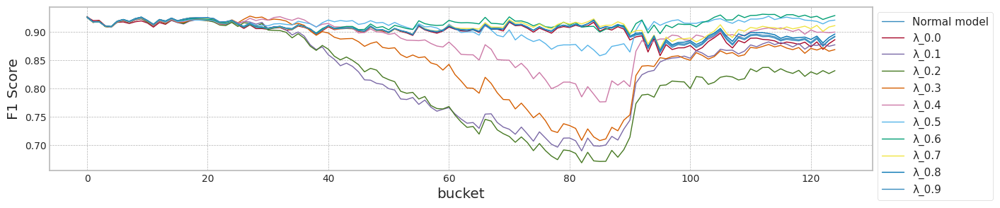

                     lambda   test_f1   init_f1   mean_f1   last_f1  MI(y^,z)
0   Loan data, Normal model  0.938040  0.925809  0.903832  0.891633  0.153446
1                       0.0  0.935800  0.926597  0.900728  0.886505  0.170659
2                       0.1  0.938539  0.927661  0.834793  0.877421  0.165837
3                       0.2  0.938245  0.926490  0.819364  0.831833  0.162695
4                       0.3  0.937568  0.925944  0.855689  0.869008  0.162337
5                       0.4  0.937996  0.925902  0.886106  0.899916  0.163935
6                       0.5  0.937996  0.926019  0.909149  0.921012  0.168158
7                       0.6  0.937996  0.926019  0.915529  0.929093  0.170099
8                       0.7  0.938334  0.926120  0.908432  0.911312  0.167598
9                       0.8  0.938334  0.925960  0.905011  0.896504  0.166503
10                      0.9  0.938334  0.926120  0.904290  0.892663  0.166935
max_mean_lambda= 0.6


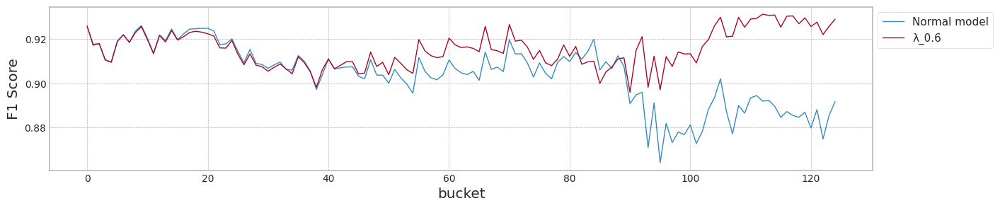

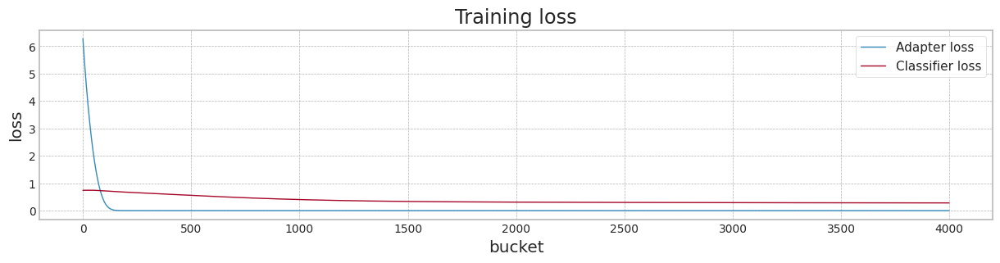

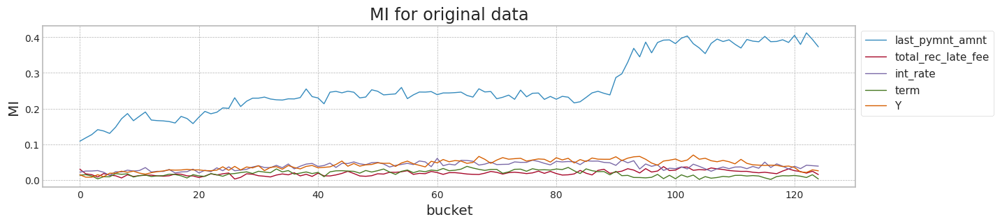

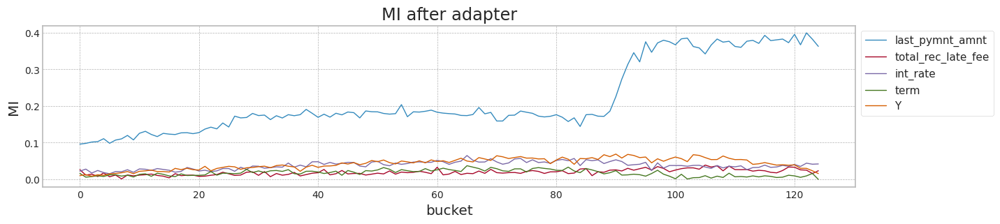

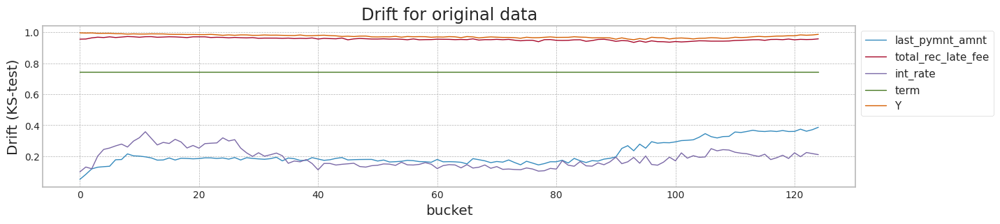

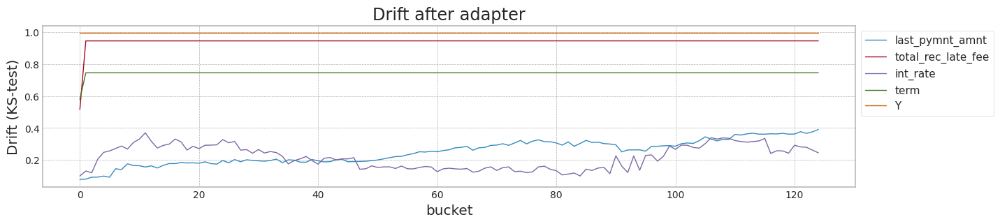

In [94]:
avaible_range = np.max(X2['b'])
seed = 1

train_tensors = Namespace(XS_train = torch.tensor(X2[0:10000].values, dtype=torch.float32),
                          y_train = torch.tensor(Y2[0:10000], dtype=torch.float32),
                          s1_train = torch.tensor(X2[0:10000][:0].values, dtype=torch.float32))
test_tensors = Namespace(XS_test = torch.tensor(X2[10000:11497].values, dtype=torch.float32),
                         y_test = torch.tensor(Y2[10000:11497], dtype=torch.float32),
                         s1_test = torch.tensor(X2[10000:11497][:0].values, dtype=torch.float32))

train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)
lambda_f_set = [-0.1,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9] #[-0.1,0.0,0.5] #
lambda_f_set2 = [1.0]
lambda_a2 = 0.0

columns = top_columns

#train_df = pd.DataFrame(X[2010][:,top_columns_index],columns=columns)
#live_df = pd.DataFrame(X2[:,top_columns_index+[81]],columns=columns+['b'])

for lambda_f2 in lambda_f_set2:
    #lambda_a2 = lambda_f2
    print('lambda_f2',lambda_f2)
    result_table = {}
    result_table2 = {}
    result_table2['lambda']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    result_table2['MI(y^,z)']=[]
    infos = {}
    for lambda_f in lambda_f_set:

        f1,mi,last_generator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, seed = seed, alpha= lambda_f2 )# 0.00057)
        tad,df_mis,df_drf = test_all_data(last_generator,last_adapter,
                                          X2[0:10000][top_columns],
                                          X2[11497:],
                                          Y2[11497:],
                                          bucket_size_array=[10000])
        if lambda_f < 0.0:
            result_table2['lambda'].append("Loan data, Normal model")
            result_table['Normal model'] = tad
        else:
            result_table2['lambda'].append(lambda_f)
            result_table[f'λ_{lambda_f}'] = tad

        infos[f'λ_{lambda_f}'] = (df_loss,df_mis,df_drf)
        result_table2['test_f1'].append(f1)
        result_table2['init_f1'].append(tad[0])
        result_table2['mean_f1'].append(np.mean(tad))
        result_table2['last_f1'].append(tad[-1])
        result_table2['MI(y^,z)'].append(mi)

    result_df = pd.DataFrame(result_table)
    result_df.plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    result4_df = pd.DataFrame(result_table2)

    print(result4_df)

    max_mean_lambda = result4_df[result4_df['mean_f1']==np.max(result4_df['mean_f1'])]['lambda']

    print('max_mean_lambda=',max_mean_lambda.values[0])

    result_df[['Normal model',f'λ_{max_mean_lambda.values[0]}']].plot(figsize=main_figsize,linewidth=1,ylabel='F1 Score',xlabel='bucket',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_loss,og_mis,og_drf = infos['λ_-0.1']
    df_loss,df_mis,df_drf = infos[f'λ_{max_mean_lambda.values[0]}']

    df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket',title='Training loss',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_mis.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='bucket',title='MI after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    og_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift for original data',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    df_drf.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',title='Drift after adapter',fontsize=10)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()